# Single cell transcriptomic analysis of all primary tumors and controls

In [107]:
library(ggplot2)
library(ggrepel)
library(plyr)
library(dplyr)
library(Seurat)
library(DescTools)
library(SingleR)
library(viridis)
library(AUCell)
library(RColorBrewer)

source("../sc_analysis_palettes_and_helpers.r")

dat_name <- "allmerged_final"

outwd <- "./data/"

## Load and filter data

### From individual 10x runs

In [ ]:
# load filtered cell barcode matrices
mycn01.data <- Read10X(data.dir = "/data/remap_DR_NB/MYCN_EGFP_tum/outs/filtered_feature_bc_matrix")
mycnlmo1v.data <- Read10X(data.dir = "/data/remap_DR_NB/MYCN_LMO1_ventral_tum_01/outs/filtered_feature_bc_matrix")
mycnlmo1k.data <- Read10X(data.dir = "/data/remap_DR_NB/MYCN_LMO1_lateral_tum_01/outs/filtered_feature_bc_matrix")
mycn02.data <- Read10X(data.dir = "/data/remap_DR_NB/MYCN_tum_02/outs/filtered_feature_bc_matrix")
healthyhkctrl.data <- Read10X(data.dir = "/data/remap_DR_NB/healthy_hk_ctrl/outs/filtered_feature_bc_matrix")
lmo1ctrl.data <- Read10X(data.dir = "/data/remap_DR_NB/LMO1_hk_ctrl/outs/filtered_feature_bc_matrix")
mycn_4.data <- Read10X(data.dir = "/data/remap_DR_NB/MYCN_tum_04/outs/filtered_feature_bc_matrix")


# initialise seurat objects, only allowing to read in genes that are detected in a minimum of three cells and cells with a minimum of 200 detected genes
mycn01 <- CreateSeuratObject(counts = mycn01.data, project = "mycn_tum_01", min.cells = 3, min.features = 200)
mycnlmo1v <- CreateSeuratObject(counts = mycnlmo1v.data, project = "mycnlmo1_ventral_tum", min.cells = 3, min.features = 200)
mycnlmo1k <- CreateSeuratObject(counts = mycnlmo1k.data, project = "mycnlmo1_kidney_tum", min.cells = 3, min.features = 200)
mycn02 <- CreateSeuratObject(counts = mycn02.data, project = "mycn_tum_02", min.cells = 3, min.features = 200)
lmo1_ctrl <- CreateSeuratObject(counts = lmo1ctrl.data, project = "lmo1_ctrl", min.cells = 3, min.features = 200)
healthyhk_ctrl <- CreateSeuratObject(counts = healthyhkctrl.data, project = "healthyhk_ctrl", min.cells = 3, min.features = 200)
mycn04 <- CreateSeuratObject(counts = mycn_4.data, project = "mycn_tum_04", min.cells = 3, min.features = 200)

rm(mycn01.data)
rm(mycnlmo1v.data)
rm(mycnlmo1k.data)
rm(mycn02.data)
rm(healthyhkctrl.data)
rm(lmo1ctrl.data)
rm(mycn_4.data)

In [ ]:
# determine percentage of mito reads
mycn01[["percent.mt"]] <- PercentageFeatureSet(object = mycn01, pattern = "^mt-")
mycnlmo1v[["percent.mt"]] <- PercentageFeatureSet(object = mycnlmo1v, pattern = "^mt-")
mycnlmo1k[["percent.mt"]] <- PercentageFeatureSet(object = mycnlmo1k, pattern = "^mt-")
mycn02[["percent.mt"]] <- PercentageFeatureSet(object = mycn02, pattern = "^mt-")
lmo1_ctrl[["percent.mt"]] <- PercentageFeatureSet(object = lmo1_ctrl, pattern = "^mt-")
healthyhk_ctrl[["percent.mt"]] <- PercentageFeatureSet(object = healthyhk_ctrl, pattern = "^mt-")
mycn04[["percent.mt"]] <- PercentageFeatureSet(object = mycn04, pattern = "^mt-")

# plot UMI, read and mito read distributions to determine filtering thresholds
allsets_list <- list(mycn01,mycnlmo1v,mycnlmo1k,mycn02,lmo1_ctrl,healthyhk_ctrl,mycn04)

for (i in 1:length(allsets_list)) {
  dat <- allsets_list[[i]]
  
  png(paste0(outwd,"pics/filterInf",dat@project.name, ".png"), width = 13, height = 15, units = 'in', res = 300)
      VlnPlot(object = dat, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3, pt.size = 0.1)
  dev.off()
  
  png(paste0(outwd,"pics/nFeature_barplot_",dat@project.name, ".png"), width = 10, height = 8, units = 'in', res = 300)
      hist(dat$nFeature_RNA, breaks = 120, border = "black") # Make plot
  dev.off()
  
  png(paste0(outwd,"pics/nFeature_barplot_xlim1000",dat@project.name, ".png"), width = 10, height = 8, units = 'in', res = 300)
      hist(dat$nFeature_RNA, breaks = 300, border = "black", xlim = range(0,1000)) # Make plot
  dev.off()
  
  png(paste0(outwd,"pics/nCount_barplot_",dat@project.name, ".png"), width = 10, height = 8, units = 'in', res = 300)
      hist(dat$nCount_RNA, breaks = 120, border = "black") # Make plot
  dev.off()
  
  png(paste0(outwd,"pics/nCount_barplot_xlim3000_",dat@project.name, ".png"), width = 10, height = 8, units = 'in', res = 300)
      hist(dat$nCount_RNA, breaks = 1000, border = "black", xlim = range(0,3000)) # Make plot
  dev.off()
  
  # Save list of barcodes before filtering
  write.table(colnames(dat), paste0(outwd,"barcodes_before_filter_",dat@project.name,".txt"), sep="\t", quote = FALSE)
  
  rm(dat)
}
rm(allsets_list)


In [ ]:
# filter based on plotted distributions
lmo1_ctrl <- subset(x = lmo1_ctrl, subset = nFeature_RNA > 600 & nFeature_RNA < 2800 & percent.mt < 10 & nCount_RNA > 2000 & nCount_RNA < 20000)
mycnlmo1v <- subset(x = mycnlmo1v, subset = nFeature_RNA > 450 & nFeature_RNA < 2500 & percent.mt < 10 & nCount_RNA > 1100 & nCount_RNA < 20000)
mycnlmo1k <- subset(x = mycnlmo1k, subset = nFeature_RNA > 320 & nFeature_RNA < 2300 & percent.mt < 10 & nCount_RNA > 850 & nCount_RNA < 15500)
healthyhk_ctrl <- subset(x = healthyhk_ctrl, subset = nFeature_RNA > 300 & nFeature_RNA < 2100 & percent.mt < 10 & nCount_RNA > 1300 & nCount_RNA < 17000)
mycn01 <- subset(x = mycn01, subset = nFeature_RNA > 250 & nFeature_RNA < 1800 & percent.mt < 10 & nCount_RNA > 500 & nCount_RNA < 8000)
mycn02 <- subset(x = mycn02, subset = nFeature_RNA > 350 & nFeature_RNA < 3100 & percent.mt < 10 & nCount_RNA > 800 & nCount_RNA < 22000)
mycn04 <- subset(x = mycn04, subset = nFeature_RNA > 310 & nFeature_RNA < 2100 & percent.mt < 9 & nCount_RNA > 1000 & nCount_RNA < 16300)


In [ ]:
# re-plot distributions for remaining cells
allsets_list <- list(mycn01,mycnlmo1v,mycnlmo1k,mycn02,lmo1_ctrl,healthyhk_ctrl, mycn04)

for (i in 1:length(allsets_list)) {
  dat <- allsets_list[[i]]
  
  png(paste0(outwd,"pics/filterInf",dat@project.name, ".png"), width = 13, height = 15, units = 'in', res = 300)
      VlnPlot(object = dat, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3, pt.size = 0.1)
  dev.off()
  
  png(paste0(outwd,"pics/nFeature_barplot_",dat@project.name, "_postFilter.png"), width = 10, height = 8, units = 'in', res = 300)
      hist(dat$nFeature_RNA, breaks = 120, border = "black") # Make plot
  dev.off()
  
  png(paste0(outwd,"pics/nFeature_barplot_xlim1500",dat@project.name, "_postFilter.png"), width = 10, height = 8, units = 'in', res = 300)
      hist(dat$nFeature_RNA, breaks = 500, border = "black", xlim = range(0,1500)) # Make plot
  dev.off()
  
  png(paste0(outwd,"pics/nCount_barplot_",dat@project.name, "_postFilter.png"), width = 10, height = 8, units = 'in', res = 300)
      hist(dat$nCount_RNA, breaks = 120, border = "black") # Make plot
  dev.off()
  
  png(paste0(outwd,"pics/nCount_barplot_xlim4000_",dat@project.name, "_postFilter.png"), width = 10, height = 8, units = 'in', res = 300)
      hist(dat$nCount_RNA, breaks = 1000, border = "black", xlim = range(0,4000)) # Make plot
  dev.off()
  
  # Save barcodes that remain after filtering
  write.table(colnames(dat), paste0(outwd,"barcodes_after_filter_",dat@project.name,".txt"), sep="\t", quote = FALSE)
  
  rm(dat)
}
rm(allsets_list)

### From MULTI-seq-runs
These data have been pre-filtered during cell-sample assignments. Only cell barcodes assigned to a sample of origin remain in the data. Sometimes, these include cells with < 200 genes, which are further filtered out here.  
Two MULTI-seq run contain test samples that should not be considered for this analysis an is removed (as indicated below).  
Furthermore, certain datasets contain allograft-cells that are also removed for now.

In [ ]:
load("./data/multi_seq_1/multi_seq_1_dr_tum_clustered.Robj")
mycnlmo1_vent_2 <- subset(x = dat, subset = nFeature_RNA > 200 & percent.mt < 10)

load("./data/multiseq2_trnscrptm_analysis/multi_seq_2_filtered_scaled.Robj")
multi_2 <- subset(x = dat, subset = nFeature_RNA > 200 & percent.mt < 10)

load("./data/multi_seq_3/trnscrptm/multi_seq_3_clustered.Robj")
multi_3 <- subset(x = dat, subset = nFeature_RNA > 200 & percent.mt < 10)

load("./data/multi_seq_4/trnscrptm/multi_4_allo1_clustered.Robj")
multi_4 <- subset(x = dat, subset = nFeature_RNA > 200 & percent.mt < 10)

load("./data/multi_allos_1/trnscrptm/multi_allos_1_clustered.Robj")
multi_a_1 <- subset(x = dat, subset = nFeature_RNA > 200 & percent.mt < 10)
Idents(multi_a_1) <- "cons_class"
multi_a_1 <- subset(multi_a_1, idents = unique(dat$cons_class[dat$cons_class %like any% "Bar%"]))
Idents(multi_a_1) <- "orig.ident"
multi_a_1 <- subset(multi_a_1, idents = c('multi_allos_1_tum'))

load("./data/multi_bAllos_1/trnscrptm/multi_bAllos_1_clustered.Robj")
multi_bA_1 <- subset(x = dat, subset = nFeature_RNA > 200 & percent.mt < 10)
Idents(multi_bA_1) <- "orig.ident"
multi_bA_1 <- subset(multi_bA_1, idents = c('multi_bAllos_1_tum'))

load("./data/multi_bAllos_2/trnscrptm/multi_bAllos_2_clustered.Robj")
multi_bA_2 <- subset(x = dat, subset = nFeature_RNA > 200 & percent.mt < 10)
Idents(multi_bA_2) <- "cons_class"
multi_bA_2 <- subset(dat, idents = unique(dat$cons_class[dat$cons_class %like any% "Bar%"]))
Idents(multi_bA_2) <- "orig.ident"
multi_bA_2 <- subset(multi_bA_2, idents = "multi_bAllos_2_tum")
dim(multi_bA_2)

# Dataset, from which one MULTI-seq sample is removed
load("./data/multi_bAllos_3/trnscrptm/multi_bAllos_3_clustered.Robj")
multi_bA_3 <- subset(x = dat, subset = nFeature_RNA > 200 & percent.mt < 10)
Idents(multi_bA_3) <- "orig.ident"
multi_bA_3 <- subset(multi_bA_3, idents = c("multi_bAllos_3_tum"))
Idents(multi_bA_3) <- "cons_class"
multi_bA_3 <- subset(multi_bA_3, idents = 'Bar4', invert = T)

load("./data/multi_bAllos_4/trnscrptm/multi_bAllos_4_clustered.Robj")
multi_bA_4 <- subset(x = dat, subset = nFeature_RNA > 200)
Idents(multi_bA_4) <- "orig.ident"
multi_bA_4 <- subset(multi_bA_4, idents = c("multi_bAllos_4_PTs_S1","multi_bAllos_4_PTs_S2"))

# Dataset, from which one MULTI-seq sample is removed
load("./data/multi_seq_17/trnscrptm/multi_seq_17_clustered.Robj")
non_met_ids <- unique(dat@meta.data$sample_all[!dat@meta.data$sample_all %like any% '%met%'])
Idents(dat) <- "sample_all"
multi_17 <- subset(x = dat, subset = nFeature_RNA > 200 & percent.mt < 10)
multi_17 <- subset(multi_17, idents = non_met_ids)


## Merge data

In [ ]:
all.comb <- merge(mycn01, y = c(mycn02, mycnlmo1v, mycnlmo1k, healthyhk_ctrl, lmo1_ctrl, mycn04, mycnlmo1_vent_2,multi_2, multi_3,multi_4, multi_a_1, multi_bA_1, multi_bA_2, multi_bA_3, multi_bA_4, multi_17),
                  add.cell.ids = c("mycn01","mycn02", "mycnlmo1v", "mycnlmo1k", "healthyhk_ctrl", "lmo1_ctrl","mycn04","mycnlmo1_v_2","multi_2", "multi_3","multi_4","multi_a_1","multi_bA_1","multi_bA_2","multi_bA_3", "multi_bA_4", "multi_17"),
                  project = "all.comb", merge.data = T)

save(all.comb, file = paste0(dat_name,"_justmerged.Robj"))


## Process merged data
### Normalize and scale

In [ ]:
# normalize all
all.comb <- NormalizeData(all.comb)

# scale all
all.genes <- rownames(x = all.comb)
all.comb <- ScaleData(object = all.comb, features = all.genes)

# save object
save(all.comb, file = paste0(dat_name,"_scaled.Robj"))


### Find variable features
and remove potential batch-effect-associated genes from hvg list.

In [4]:
load(paste0(dat_name,"_scaled.Robj"))

In [ ]:
# Find genes that are expressed in the majority of cells (of all cell types) in a given sample and more highly expressed in that sample than in all others.
# These genes, which are found across cell types, are likely associated with inter-sample batch-effects.

Idents(all.comb) <- "orig.ident"

to.regress <- FindAllMarkers(object = all.comb, only.pos = TRUE, min.pct = 0.8, logfc.threshold = 0.2)

to.regress <- to.regress$gene
to.regress <- unique(to.regress)

# Print out list of genes
write.csv(to.regress, file ="./data/genestoregress.csv", quote = F)


In [6]:
# Reload genes to remove from hvgs
to.regress <- read.delim("./data/genestoregress.csv",
  row.names = 1, header = T, stringsAsFactors = F, sep = ',')

to.regress <- to.regress$x

# Load genes associated with the cell cycle that should also be excluded from hvg list
to.regress.cellcycle <- read.csv("zfish_prolif_markers.csv")
to.regress.cellcycle <- as.character(to.regress.cellcycle$x)


In [8]:
unique(to.regress)
unique(to.regress.cellcycle)

[1] "mt-nd3"            "rpl29"             "RPL41"            
  [4] "tmsb4x"            "mt-co1"            "mt-atp6"          
  [7] "actb2"             "rps28"             "mt-co2"           
 [10] "cirbpb"            "mt-nd1"            "CR318588.4"       
 [13] "rpl36"             "CR318588.1"        "rpl37.1"          
 [16] "rpl39"             "rplp2"             "FO704736.1"       
 [19] "hbaa1"             "mt-nd4"            "rpl34"            
 [22] "mt-cyb"            "hbba1.1"           "mt-co3"           
 [25] "ppiaa"             "rpl38"             "cirbpa"           
 [28] "CR383676.1"        "hnrnpa0l.1"        "cfl1"             
 [31] "rpl32"             "ybx1"              "sec61g"           
 [34] "b2m"               "h2afvb"            "hspa8"            
 [37] "eef1a1l1"          "tpt1"              "ppiab"            
 [40] "mt-nd2"            "rps25"             "khdrbs1a"         
 [43] "rps2"              "b2ml"              "nme2b.1"          
 [46] "actb1"             "oaz1b"             "eef2b"            
 [49] "rpl5b"             "rack1"             "rps6"             
 [52] "gapdhs"            "eif3ea"            "h3f3d"            
 [55] "pnrc2"             "ddx5"              "slc25a3b"         
 [58] "ubc"               "rgs5a"             "rpl22l1"          
 [61] "ncl"               "tmsb"              "npm1a"            
 [64] "rps27.2"           "rpl14"             "cycsb"            
 [67] "si:ch211-222l21.1" "rpl27"             "rps15"            
 [70] "fabp3"             "rpl24"             "mibp2"            
 [73] "rpl23a"            "rps12"             "rpl23"            
 [76] "rps24"             "rps18"             "rplp2l"           
 [79] "rps23"             "rpl35"             "rps11"            
 [82] "uba52"             "faua"              "rps27.1"          
 [85] "rps15a"            "rpl18a"            "zgc:114188"       
 [88] "rps17"             "rpl31"             "rps10"            
 [91] "rpl4"              "rpl18"             "rpl28"            
 [94] "rps13"             "rpl3"              "rplp1"            
 [97] "rpl10"             "rps14"             "rpl22"            
[100] "rps19"             "rpl36a"            "rps27a"           
[103] "rpl30"             "rps21"             "EGFP"             
[106] "ptmaa"             "rps16"             "rps26"            
[109] "hbba1"             "si:ch211-5k11.8"   "hbaa2"            
[112] "NC-002333.4"       "hbba2"             "fth1a"            
[115] "vtg1"              "si:ch211-103n10.5" "mhc1uba"          
[118] "mt-nd5"            "prdx2"             "mhc1zba"          
[121] "rsl24d1"           "lyz"               "pfn1"             
[124] "gpx1a"             "ucp2"              "xbp1"             
[127] "h3f3b.1"           "hmgn2"             "tuba8l4"          
[130] "hmgb2a"            "sat1a.2"           "chac1"            
[133] "tubb4b"            "ptmab"             "zgc:56493"        
[136] "mcl1a"             "slc25a5"           "zgc:92066"        
[139] "midn"              "btg2"              "fosab"            
[142] "pabpc1a"           "rps29"             "eif5a"            
[145] "rpl6"              "eif1b"             "eef1b2"           
[148] "rplp0"             "hsp90ab1"          "rpl19"            
[151] "rps5"              "rpl17"             "rpl9"             
[154] "rpl7"              "rps8a"             "rpl10a"           
[157] "rpl8"              "rps4x"             "naca"             
[160] "eef1g"             "serbp1a"           "rps3a"            
[163] "rpl7a"             "rpl15"             "rps7"             
[166] "rpl12"             "btf3"              "ran"              
[169] "eef1db"            "hist2h2l"          "hand2"            
[172] "h2afx1"            "rpl13"             "cct4"             
[175] "rpl11"             "rpl5a"             "rps3"             
[178] "rpl21"             "rps9"              "rpl13a"           
[181] "rpsa"              "eef1da"        

[1] "atad2"    "blm"      "brip1"    "casp8ap2" "cdc45"    "cdc6"    
  [7] "cdca7a"   "chaf1b"   "dscc1"    "dtl"      "e2f8"     "exo1"    
 [13] "fen1"     "gins2"    "gmnn"     "hells"    "mcm2"     "mcm4"    
 [19] "mcm5"     "mcm6"     "msh2"     "nasp"     "pcna"     "pola1"   
 [25] "pold3"    "prim1"    "rad51"    "rad51ap1" "rfc2"     "rpa2"    
 [31] "rrm1"     "rrm2"     "slbp"     "tipin"    "tyms"     "ubr7"    
 [37] "uhrf1"    "unga"     "ungb"     "usp1"     "wdr76"    "anln"    
 [43] "anp32e"   "aurka"    "birc5a"   "birc5b"   "bub1"     "cbx5"    
 [49] "ccnb2"    "cdc20"    "cdca8"    "cdk1"     "cenpe"    "cenpf"   
 [55] "ckap2l"   "ckap5"    "cks1b"    "cks2"     "ctcf"     "dlgap5"  
 [61] "ect2"     "g2e3"     "gas2l3"   "gtse1"    "hmgb2a"   "hmgb2b"  
 [67] "hmmr"     "kif11"    "kif20ba"  "kif20bb"  "kif23"    "kif2c"   
 [73] "lbr"      "mki67"    "ncapd2"   "ndc80"    "nek2"     "nuf2"    
 [79] "nusap1"   "rangap1a" "rangap1b" "tacc3"    "tmpoa"    "tmpob"   
 [85] "top2a"    "tpx2"     "ttk"      "tubb4b"   "ube2c"    "stmn1a"  
 [91] "plk1"     "ccnb1"    "aspm"     "kifc1"    "smc2"     "hmgn2"   
 [97] "DUT"      "tubb2b"   "tuba8l4"  "stmn1b"

In [9]:
# Find variable features and remove suspected batch-associated genes, cell cycle markers and the human transgenes
all.comb <- FindVariableFeatures(object = all.comb,selection.method = 'vst', nfeatures = 2000)
var_feats <- VariableFeatures(object = all.comb)
var_feats <- var_feats[!var_feats %in% c("mCherry", "EGFP","MYCN", "LMO1", "BIRC5","dTomato")]
var_feats <- var_feats[!var_feats %in% to.regress]
var_feats <- var_feats[!var_feats %in% to.regress.cellcycle]

length(var_feats)

[1] 1935

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”


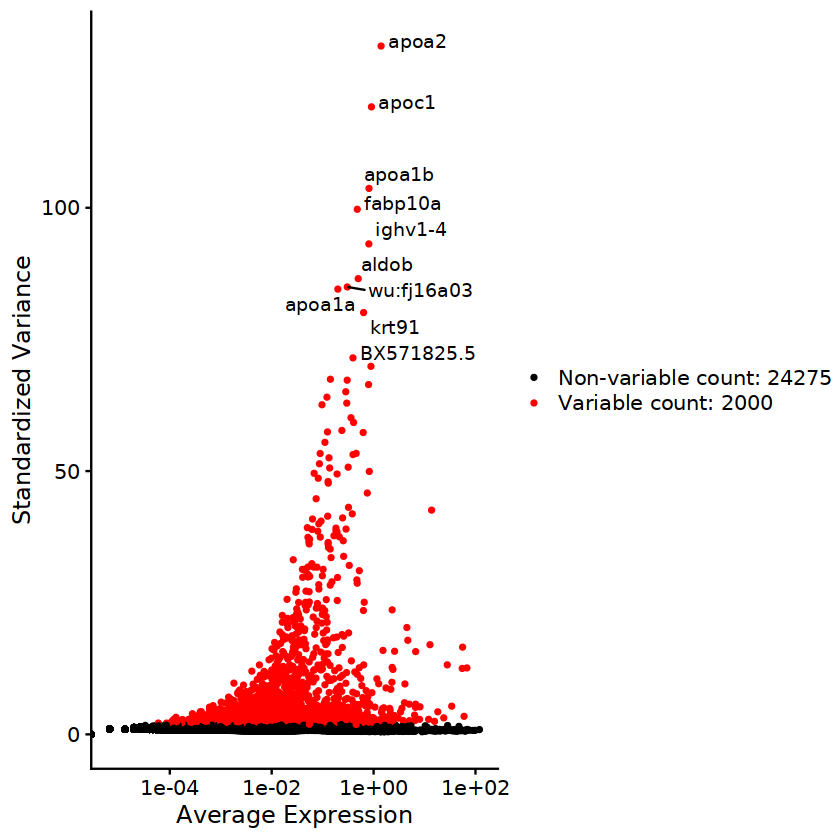

In [10]:
# Plot top variable genes
top10 <- head(x = VariableFeatures(object = all.comb), 10)
plot1 <- VariableFeaturePlot(object = all.comb)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
print(plot2)


### Run PCA

In [18]:
# Run PCA using hvgs features as input
all.comb <- RunPCA(all.comb, features = var_feats, npcs = 100)


PC_ 1 
Positive:  gch2, ddc, egr4, gch1, rln1, npas4a, si:dkey-205h13.1, scg2b, vgf, zgc:153426 
	   atp1b1b, mt2, akr1b1, h1f0, hspa4l, rrad, isl1, laptm4b, chgb, angptl4 
	   tob1a, rbp1, pvalb8, fam46ba, zgc:64022, si:rp71-1h20.9, slc6a17, zgc:123068, stmn4l, scn1lab 
Negative:  srgn, BX908782.2, fcer1gl, cebpb, lect2l, si:ch211-9d9.1, cd63, si:dkey-102g19.3, crip1, rac2 
	   alox5ap, CT030188.1, scpp8, il1b, npsn, arpc1b, cotl1, spi1b, si:ch211-264f5.2, si:ch73-343l4.8 
	   ncf1, timp2b, icn, mpx, illr4, myh9a, tmsb1, coro1a, mmp13a.1, s100a10b 
PC_ 2 
Positive:  lect2l, npsn, si:ch211-9d9.1, BX908782.2, mpx, scpp8, illr4, mmp13a.1, si:ch73-343l4.8, mmp9 
	   alox5ap, si:ch211-284o19.8, si:ch211-264f5.2, zgc:77112, ch25hl2, si:ch211-260e23.8, cpa5, il6r, cd7al, ctss1 
	   si:dkey-195m11.11, si:dkey-27h10.2, si:ch1073-429i10.1, CT030188.1, vamp8, scinlb, il1b, si:ch73-248e21.7, CU499336.2, si:dkey-102g19.3 
Negative:  krt8, rbp4, krt18, selenop, ahnak, anxa2a, sparc, si:ch73-335l21.

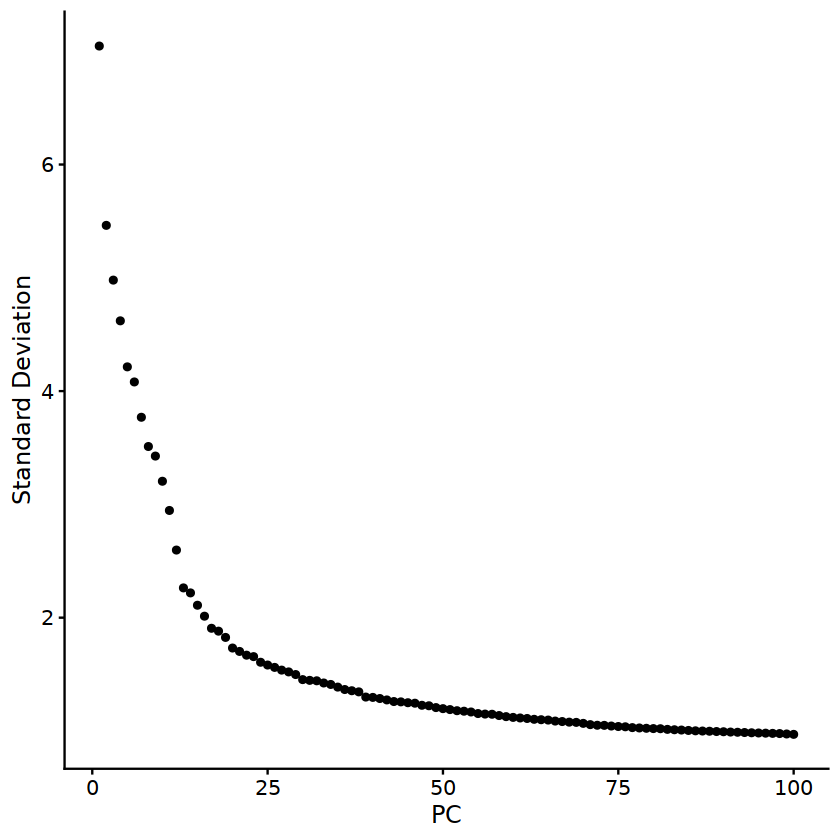

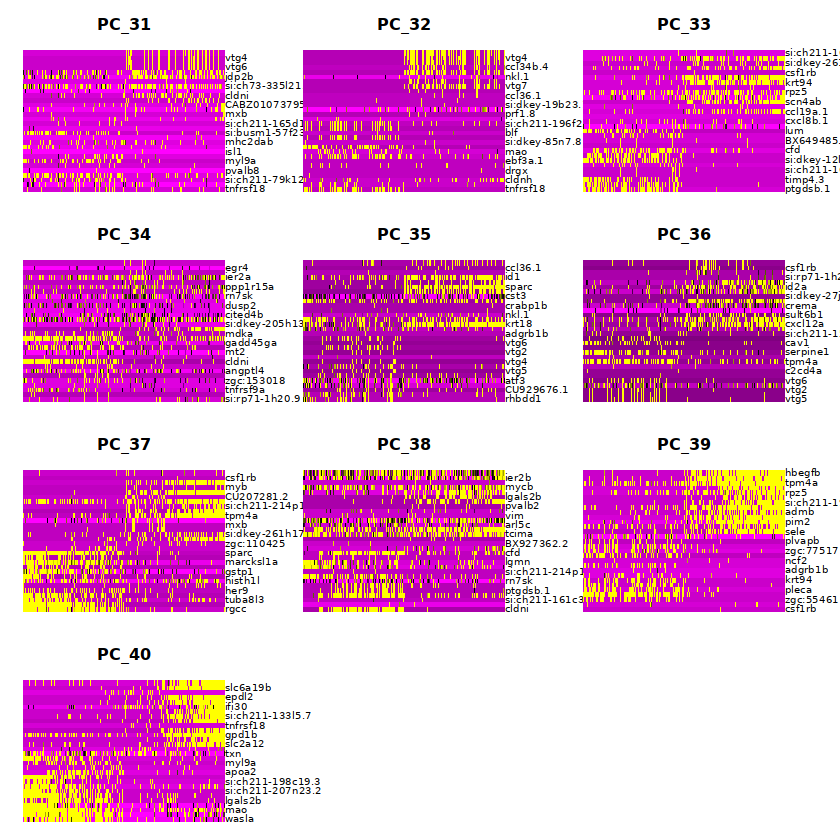

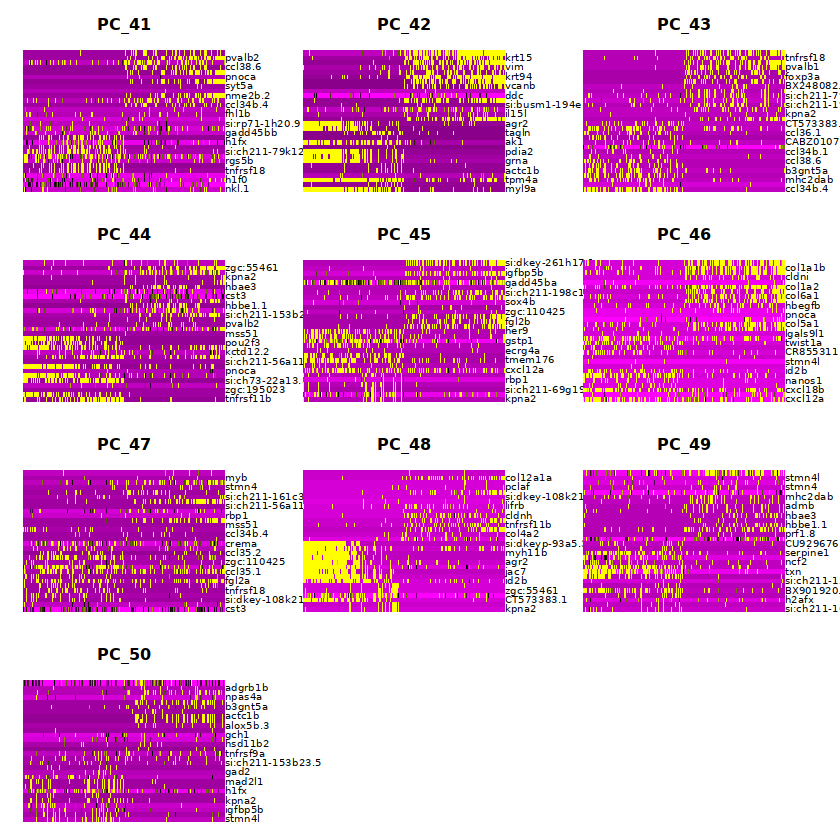

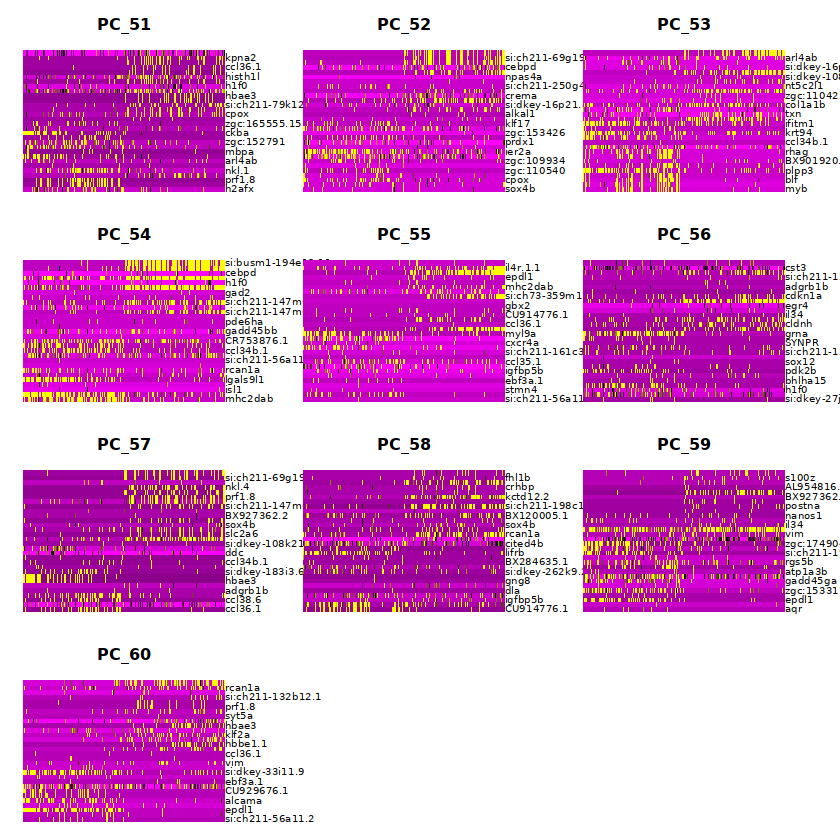

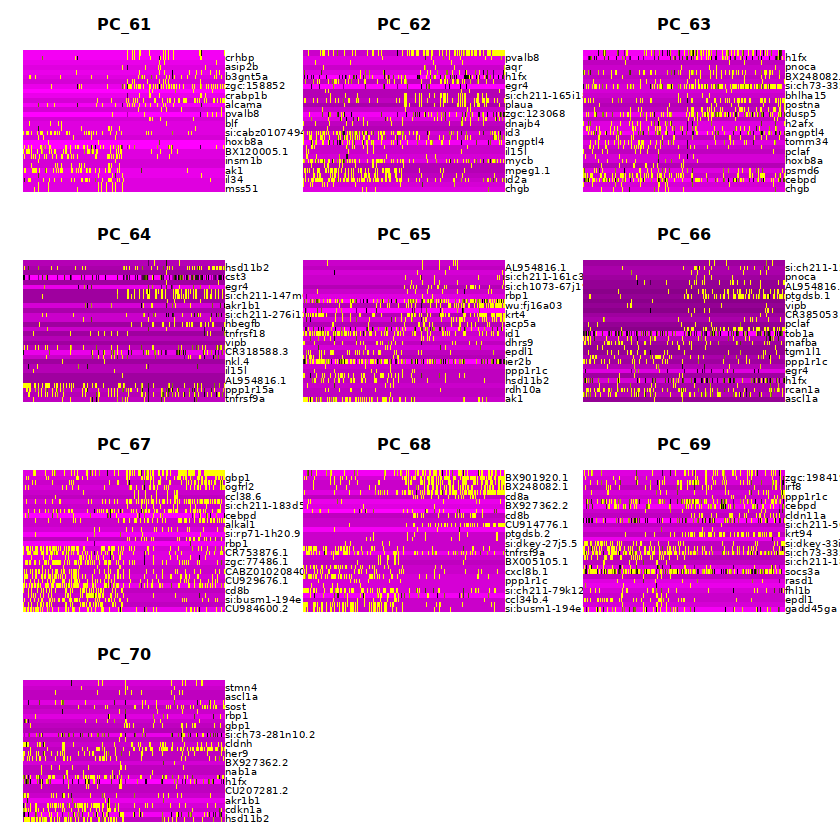

In [19]:
# Plot elbow plots and top PC gene expression heatmaps to determine a suitable number of PCs to use

ElbowPlot(object = all.comb, ndims = 100)

DimHeatmap(object = all.comb, dims = 31:40, cells = 500, balanced = TRUE)
DimHeatmap(object = all.comb, dims = 41:50, cells = 500, balanced = TRUE)
DimHeatmap(object = all.comb, dims = 51:60, cells = 500, balanced = TRUE)
DimHeatmap(object = all.comb, dims = 61:70, cells = 500, balanced = TRUE)

In [20]:
# Set number of principal components to use

ndims <- 60

### Lovain clustering and UMAP

In [21]:
# Clustering; first determine a suitable number k for the dataset size
k <- round(max(20,sqrt(ncol(all.comb)))/4)
if(k %% 2 == 0) {k <- k+1}
if(k > 41) {k <- 41}

# Cluster
all.comb <- FindNeighbors(object = all.comb, dims = 1:ndims, k.param = k)
all.comb <- FindClusters(object = all.comb, resolution = 1.1)

# Run PCA
all.comb <- RunUMAP(all.comb, reduction = "pca", dims = 1:ndims)

# SAVE OBJECT
save(all.comb, file = paste0(outwd,dat_name,"_clustered.Robj"))


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 151217
Number of edges: 11175025

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9252
Number of communities: 107
Elapsed time: 125 seconds


56 singletons identified. 51 final clusters.

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
14:39:41 UMAP embedding parameters a = 0.9922 b = 1.112

14:39:41 Read 151217 rows and found 60 numeric columns

14:39:41 Using Annoy for neighbor search, n_neighbors = 30

14:39:41 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:40:17 Writing NN index file to temp file /tmp/RtmpHE02WO/file18e482c2383f9

14:40:17 Searching Annoy index using 1 thread, search_k = 3000

14:41:56 Annoy recall = 100%

14:41:58 Commencing smooth kNN distance cali

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



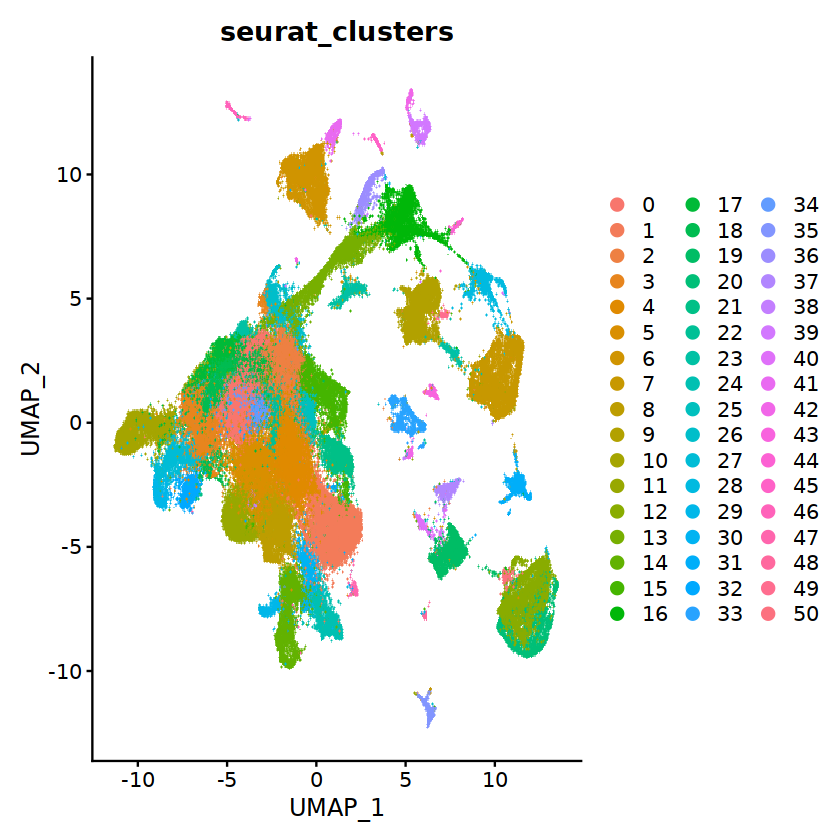

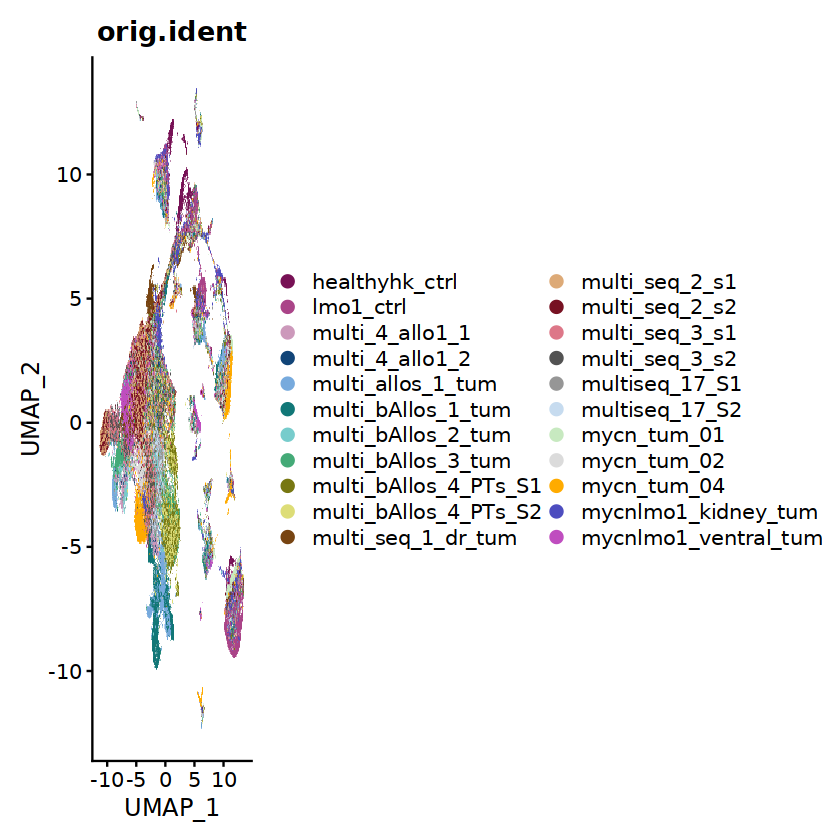

In [22]:
# Initial UMAP plots
DimPlot(object = all.comb, reduction = 'umap', pt.size = 0.5, group.by = "seurat_clusters")
DimPlot(object = all.comb, reduction = 'umap', pt.size = 0.5, cols = tol21rainbow[c(1,2,3,4,6,7,9,11,13,15,16,18,19,21,22,23,25,27,28,30,31,32)], group.by = "orig.ident", shuffle = T)


### Cell type annotation

#### Plot cell type marker gene expression across clusters
Below, I load a combined table of zebrafish cell type marker genes from Tang et al. 2017 (DOI 10.1084/jem.20170976) and Hu et al. 2022 (DOI 10.1038/s41588-022-01129-5). These are derived from scRNA-seq analyses of the zebrafish head kidney (including haematopoietic cells) and the zebrafish heart, respectively. Additionally, a neuroblastoma transgene and marker signature and the ADRN and MES signatures from Van Groningen et al. 2017 (DOI 10.1038/ng.3899) are included.  
  
**Rationale**  
- Calculate expression scores for each signature in all of the clusters using Seurat's AddModuleScore function.
- If a cluster represents a cell type represented in the cell type marker list or a related cell type, it will show an increased expression score for that signature.
- This is used for initial broad cell type annotation.

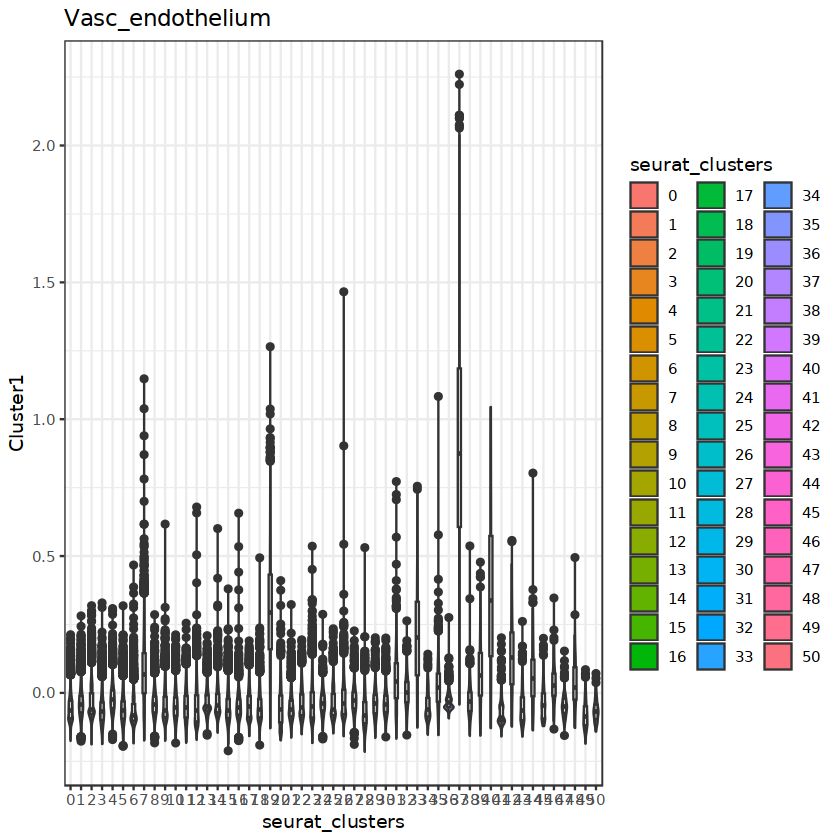

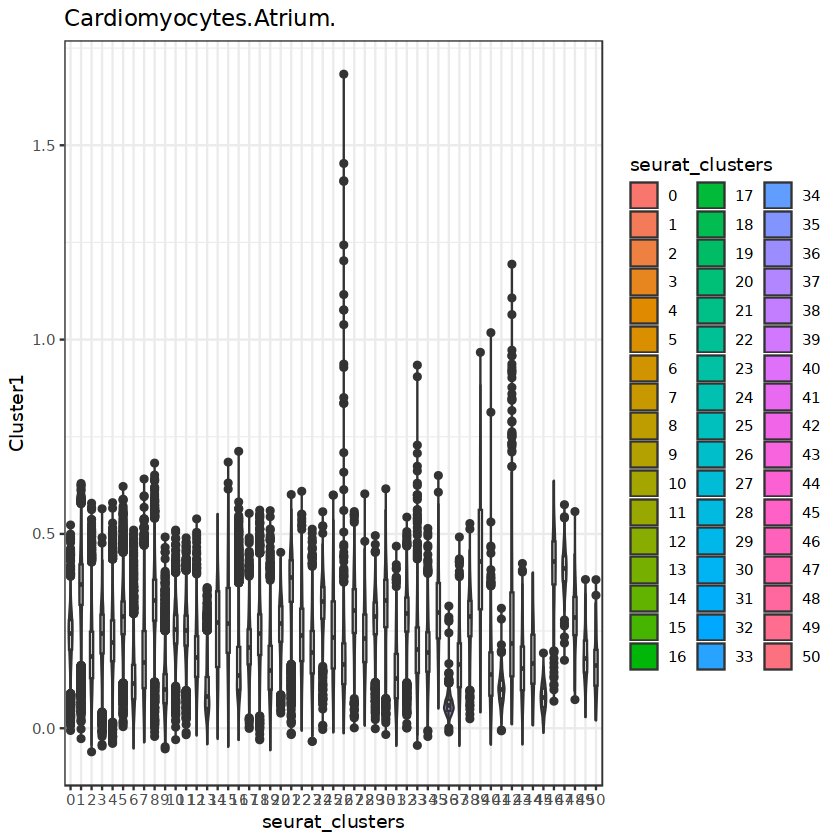

In [27]:
clusterMarkers_all <- read.delim("./celltype_assign_files/celltype_markers_tang_hu_clean.csv", stringsAsFactors = F, sep = ",")

dat <- all.comb

# Select three random signatures for in-line plotting
set.seed(265)
plot_sig_numbs <- sample(1:ncol(clusterMarkers_all), 3)

# Get mean expression of genes of interest per cell and plot mean expression of signature genes
for(i in 1:ncol(clusterMarkers_all)){
    
    # Extract individual signature.
    # Make sure at least 4 signature genes are present in the data. If not, move on to next signature.
    gene.set <- clusterMarkers_all[,i][is.na(clusterMarkers_all[,i]) == F]
    gene.set <- gene.set[gene.set %in% rownames(GetAssayData(object = dat, slot = "scale.data"))]
    if(length(gene.set) <= 3) next

    avexp_test <- AddModuleScore(
      dat,
      features = list(gene.set),
      enrich.name = "geneset"
    )
    avexp_test <- as.data.frame(avexp_test@meta.data)

    png(paste0("./data/pics/VlnPlot_Markers_ModuleScore_",dat_name,"_",colnames(clusterMarkers_all)[i], ".png"), width = 18, height = 5, units = 'in', res = 300)
        print(ggplot(avexp_test, aes(x = seurat_clusters, y = Cluster1, fill = seurat_clusters)) +
                      geom_violin(alpha = 1) +
                      geom_boxplot(width=0.1, fill = "white") +
                      theme_bw()
        )
    dev.off()
    
    if(i %in% plot_sig_numbs){
        print(ggplot(avexp_test, aes(x = seurat_clusters, y = Cluster1, fill = seurat_clusters)) +
                      geom_violin(alpha = 1) +
                      geom_boxplot(width=0.3, fill = "white") +
                      ggtitle(paste0(colnames(clusterMarkers_all)[i])) +
                      theme_bw()
        )
    }

}
  
rm(dat)

#### Find cluster marker genes

In [ ]:
Idents(all.comb)<- "seurat_clusters"

# Find markers:
markers_all_pos <- FindAllMarkers(object = all.comb, only.pos = TRUE, min.pct = 0.5, logfc.threshold = 0.8)

# Then print to file
write.csv(markers_all_pos, file = paste0("./celltype_assign_files/clusterMarkersAll_",dat_name,"_seurclusts_minpct50_logfct_80.csv"))


#### Annotate clusters with celltypes

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



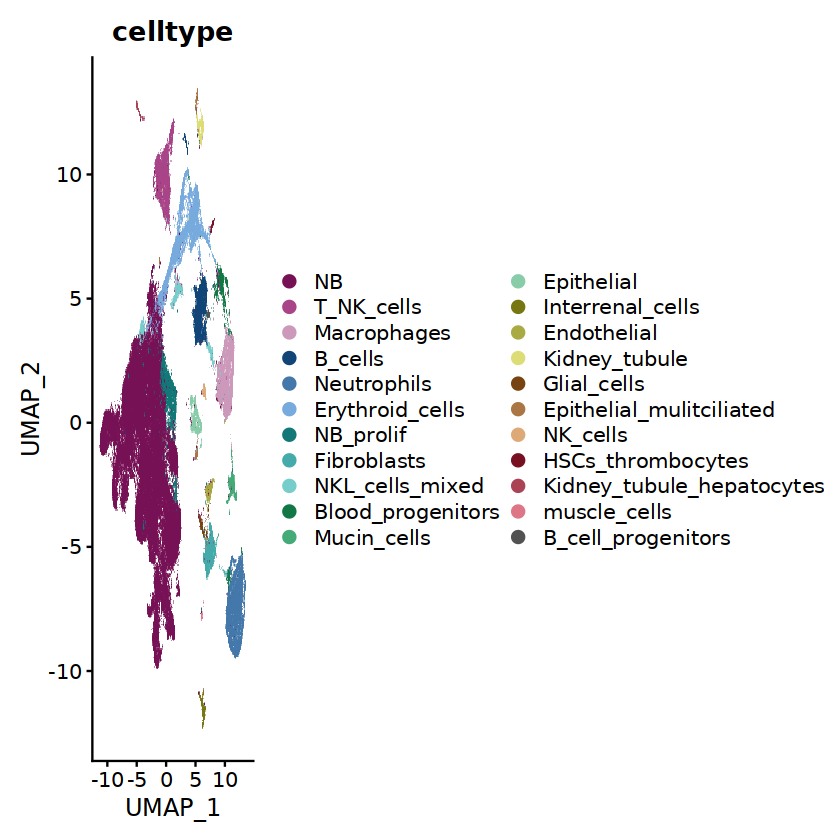

In [151]:

Idents(all.comb) <- 'seurat_clusters'

all.comb <- RenameIdents(object = all.comb,
                        '0' = 'NB',
                        '1' = 'NB',
                        '2' = 'NB',
                        '3' = 'NB',
                        '4' = 'NB',
                        '5' = 'NB',
                        '6' = 'T_NK_cells',
                        '7' = 'Macrophages',
                        '8' = 'NB',
                        '9' = 'B_cells',
                        '10' = 'NB',
                        '11' = 'NB',
                        '12' = 'Neutrophils',
                        '13' = 'Erythroid_cells',
                        '14' = 'NB',
                        '15' = 'NB_prolif',
                        '16' = 'Erythroid_cells',
                        '17' = 'NB',
                        '18' = 'NB',
                        '19' = 'Fibroblasts',
                        '20' = 'Neutrophils',
                        '21' = 'NB',
                        '22' = 'NB',
                        '23' = 'NKL_cells_mixed',
                        '24' = 'NB',
                        '25' = 'NB',
                        '26' = 'NB',
                        '27' = 'NB',
                        '28' = 'Blood_progenitors',
                        '29' = 'NB',
                        '30' = 'NB',
                        '31' = 'Mucin_cells',
                        '32' = 'NB',
                        '33' = 'Epithelial',
                        '34' = 'NB',
                        '35' = 'Interrenal_cells',
                        '36' = 'Erythroid_cells',
                        '37' = 'Endothelial',
                        '38' = 'NB',
                        '39' = 'Kidney_tubule',
                        '40' = 'Glial_cells',
                        '41' = 'T_NK_cells',
                        '42' = 'Epithelial_mulitciliated',
                        '43' = 'NK_cells',
                        '44' = 'HSCs_thrombocytes',
                        '45' = 'B_cells',
                        '46' = 'Kidney_tubule_hepatocytes',
                        '47' = 'NB',
                        '48' = 'muscle_cells',
                        '49' = 'B_cell_progenitors',
                        '50' = 'Blood_progenitors'
)

# save celltype information in the meta.data
all.comb$celltype <- Idents(all.comb)

# Plot
DimPlot(object = all.comb, reduction = 'umap', pt.size = 0.5, group.by = "celltype", cols = tol21rainbow, shuffle = T)


### Add sample metadata info

In [111]:
# Load metadata info
samp_info_all <- read.delim('./samp_metadata.csv', stringsAsFactors = F, sep = ';')


In [116]:
# Add a sample ID column to Seurat metadata to enable merging 
all.comb@meta.data <- all.comb@meta.data[,!(colnames(all.comb@meta.data) %in% colnames(samp_info_all))]

all.comb@meta.data$sample_id <- all.comb@meta.data$orig.ident
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident %in% c("multi_seq_2_s1","multi_seq_2_s2")] <- paste0("multi_seq_2_",all.comb@meta.data$cons_class[all.comb@meta.data$orig.ident %in% c("multi_seq_2_s1","multi_seq_2_s2")])
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "multi_seq_3_s1"] <- paste0("multi_seq_3_",all.comb@meta.data$cons_class[all.comb@meta.data$orig.ident == "multi_seq_3_s1"])
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "multi_seq_3_s2"] <- paste0("multi_seq_3_",all.comb@meta.data$cons_class[all.comb@meta.data$orig.ident == "multi_seq_3_s2"])
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident %in% c("multi_4_allo1_1","multi_4_allo1_2")] <- paste0("multi_seq_4_",all.comb@meta.data$cons_class[all.comb@meta.data$orig.ident %in% c("multi_4_allo1_1","multi_4_allo1_2")])
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "multi_allos_1_tum"] <- paste0("multi_allos_1_tum_",all.comb@meta.data$cons_class[all.comb@meta.data$orig.ident == "multi_allos_1_tum"])
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "multi_bAllos_1_tum"] <- all.comb@meta.data$cons_class[all.comb@meta.data$orig.ident == "multi_bAllos_1_tum"]
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "multi_bAllos_2_tum"] <- paste0("multi_bAllos_2_tum_",all.comb@meta.data$cons_class[all.comb@meta.data$orig.ident == "multi_bAllos_2_tum"])
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "multi_bAllos_3_tum"] <-paste0("multi_bAllos_3_tum_",all.comb@meta.data$cons_class[all.comb@meta.data$orig.ident == "multi_bAllos_3_tum"])

all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident %in% c("multi_bAllos_4_PTs_S1","multi_bAllos_4_PTs_S2")] <-paste0("multi_bAllos_4_tum_",all.comb@meta.data$cons_class[all.comb@meta.data$orig.ident %in% c("multi_bAllos_4_PTs_S1","multi_bAllos_4_PTs_S2")])
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident %in% c("multiseq_17_S1","multiseq_17_S2")] <-paste0("multi_seq_17_",all.comb@meta.data$cons_class[all.comb@meta.data$orig.ident %in% c("multiseq_17_S1","multiseq_17_S2")])

all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "mycn_tum_01"] <- "MYCN_EGFP_1"
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "mycn_tum_02"] <- "MYCN_1"
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "mycnbirc5_tum"] <- "MYCN_BIRC5_1"
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "mycnlmo1_ventral_tum"] <- "MYCN_LMO1_vent_1_1"
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "mycnlmo1_kidney_tum"] <- "MYCN_LMO1_lat_1_1"
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "healthyhk_ctrl"] <- "EGFP_ctrl_1"
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "lmo1_ctrl"] <- "LMO1_ctrl_1"
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "mycn_tum_04"] <- "MYCN_2"
all.comb@meta.data$sample_id[all.comb@meta.data$orig.ident == "multi_seq_1_dr_tum"] <- "multi_seq_1_MYCNLMO1"


In [117]:
metadat <- all.comb@meta.data

table(samp_info_all$sample_id %in% metadat$sample_id)
table(metadat$sample_id %in% samp_info_all$sample_id)

unique(samp_info_all$sample_id[!samp_info_all$sample_id %in% metadat$sample_id])
unique(metadat$sample_id[!metadat$sample_id %in% samp_info_all$sample_id])


TRUE 
  81 


  TRUE 
151217 

character(0)

character(0)

In [118]:
# Merge and check whether rownames in new metadata object correspond to old metadata version.
metadat_ext <- join(all.comb@meta.data, samp_info_all, by = "sample_id")
rownames(metadat_ext) <- rownames(metadat)

table(rownames(metadat_ext) == rownames(all.comb@meta.data))


  TRUE 
151217 

In [119]:
# If the above is 100 % TRUE, add metadata to
all.comb@meta.data <- metadat_ext

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



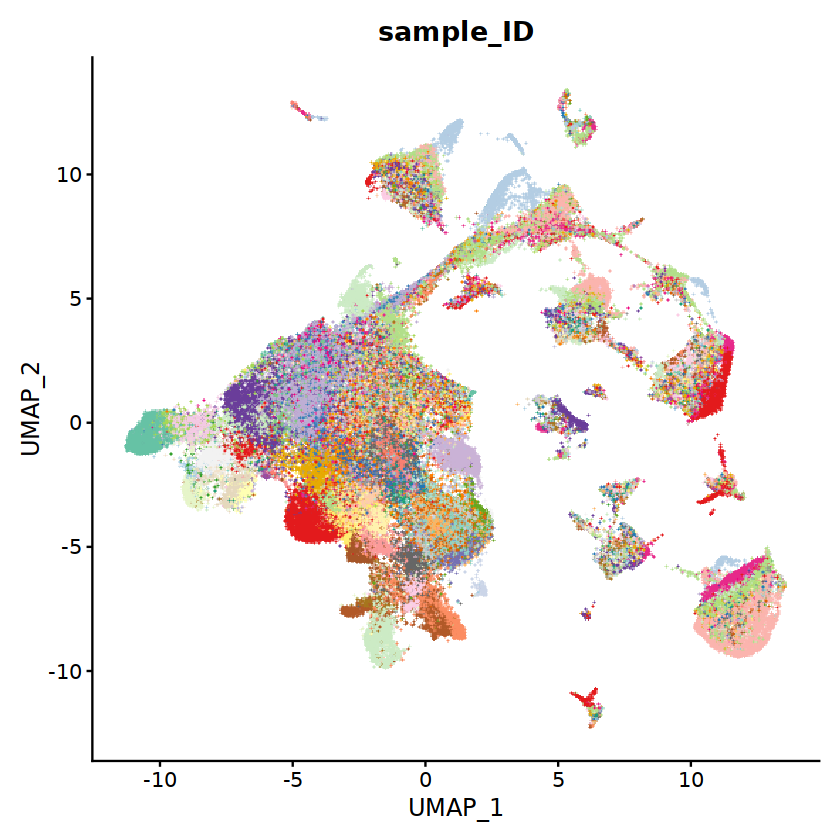

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



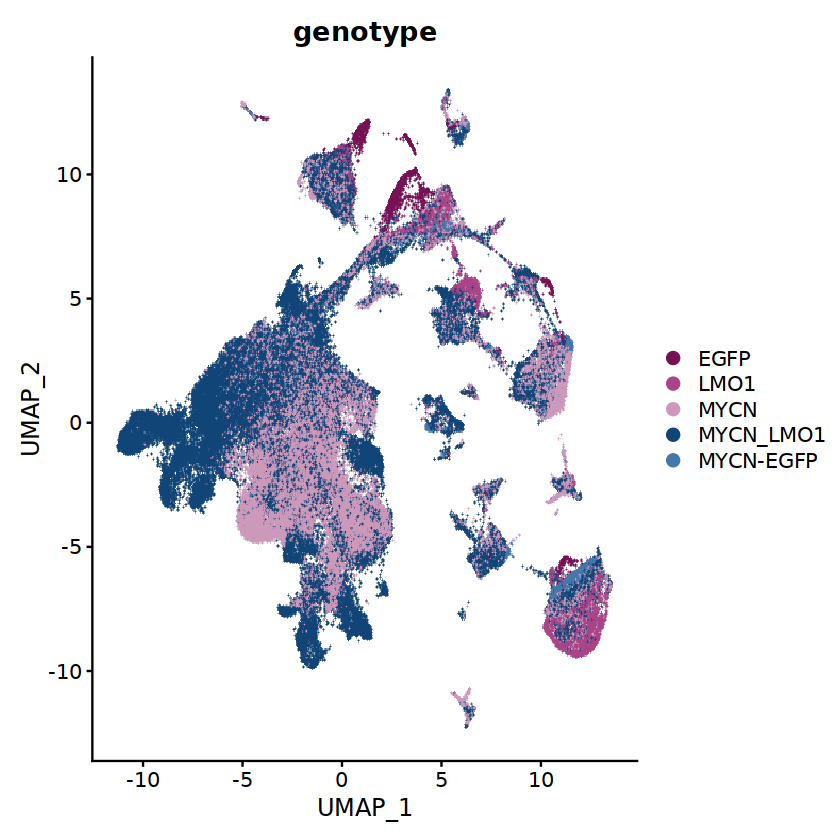

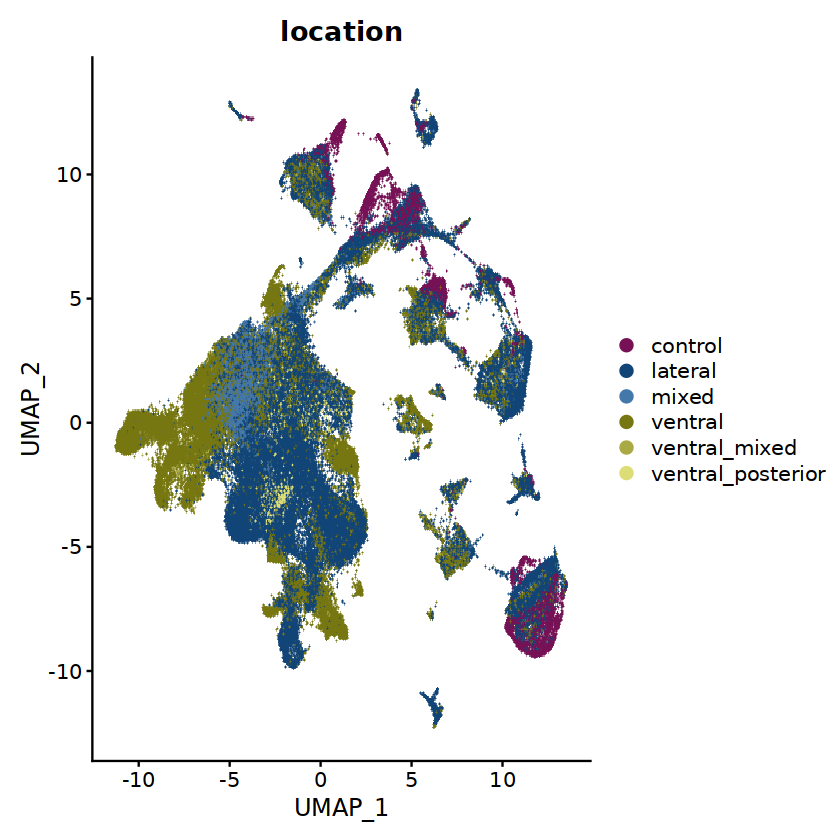

In [123]:
# Plot

library(RColorBrewer)
n <- length(unique(all.comb@meta.data$sample_ID))
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector_det = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))
col_vector_det=sample(col_vector_det, n)

# Tumor sample ID
DimPlot(object = all.comb, reduction = 'umap', pt.size = 0.5, group.by = "sample_ID", cols = col_vector_det, shuffle = T) +
                     NoLegend()

# Fish genotype
DimPlot(object = all.comb, reduction = 'umap', pt.size = 0.5, group.by = "genotype", cols = tol21rainbow, shuffle = T)

# Tumor location
DimPlot(object = all.comb, reduction = 'umap', pt.size = 0.5, group.by = "location", cols = tol21rainbow[c(1,4,5,13,14,15,17)], shuffle = T)


In [124]:
dat_name <- "allmerged_final"

save(all.comb, file = paste0(outwd,dat_name,"_clustered.Robj"))

## Subcluster analyses

### Subset NB cells and sub-cluster

In [154]:
sub_dat_name <- "allmerged_final_nrblstm"
dat_name <- "allmerged_final"

In [42]:
# Reload data
load(paste0(outwd,dat_name,"_clustered.Robj"))

In [155]:
# Subset
Idents(all.comb) <- "celltype"
dat_sub <- subset(all.comb, idents = c("NB","NB_prolif"))


#### Process

In [156]:
# scale all
dat_sub <- NormalizeData(dat_sub)

all.genes <- rownames(x = dat_sub)
dat_sub <- ScaleData(object = dat_sub, features = all.genes ,
                     vars.to.regress = c("nCount_RNA", "percent.mt")
                    )


Regressing out nCount_RNA, percent.mt

Centering and scaling data matrix



In [157]:
# save object
save(dat_sub, file = paste0(outwd,sub_dat_name,"_scaled.Robj"))


In [158]:
# Reload genes to regress
to.regress <- read.delim("./data/genestoregress.csv",
  row.names = 1, header = T, stringsAsFactors = F, sep = ',')

to.regress <- to.regress$x

# Load genes associated with the cell cycle that should also be excluded for clustering
to.regress.cellcycle <- read.csv("./zfish_prolif_markers.csv")
to.regress.cellcycle <- as.character(to.regress.cellcycle$x)

In [159]:
# Find variable features

dat_sub <- FindVariableFeatures(object = dat_sub,selection.method = 'vst', nfeatures = 2000)

var_feats <- VariableFeatures(object = dat_sub)

var_feats <- var_feats[!var_feats %in% c("mCherry", "EGFP","MYCN", "LMO1", "BIRC5","dTomato")]
var_feats <- var_feats[!var_feats %in% to.regress]
var_feats <- var_feats[!var_feats %in% to.regress.cellcycle]

PC_ 1 
Positive:  atp1b1b, ahsa1b, wbp2, laptm4b, zfand2a, tob1a, brdt, mlf1, sqstm1, mindy3 
	   zgc:153426, oser1, fam46ba, slc35g2a, si:ch211-199o1.2, tuba2, klf13, serpinh1b, chordc1a, zgc:101583 
	   gch1, tiparp, tob1b, gadd45ab, cyb5a, si:dkey-205h13.1, usp2a, hspa4l, crema, scn1lab 
Negative:  pvalb8, nkl.1, si:dkey-197i20.6, CR318588.3, eif4ebp3l, si:dkey-188i13.7, socs3b, gad2, syt5a, gng8 
	   bik, asip2b, hint2, BX649478.1, CU459186.5, cldnh, cxcl12a, CU207281.2, otx2b, ponzr1 
	   si:dkey-185m8.2, hhip, otx1, zgc:194678, si:dkey-248g21.1, si:ch211-132b12.1, aqr, irf1b, nhlh2, CU179756.1 
PC_ 2 
Positive:  fosb, dusp2, egr1, epas1b, mab21l2, vgf, rbp1, map1ab, xab2, rln1 
	   cox8b, akr1b1, rgs5b, dbh, egr4, gch1, zgc:64022, sstr1a, slc5a1, rasd1 
	   rbp5, crhbp, egr3, ddc, cdaa, tcf7l2, pim1, mab21l1, si:dkey-175g6.2, tob1a 
Negative:  CR318588.3, cldnh, bik, si:dkey-85n7.8, isg15, epcam, BX927362.2, zgc:152791, si:dkey-188i13.7, nhlh2 
	   cxcl12a, gng8, CU207281.2, CU98

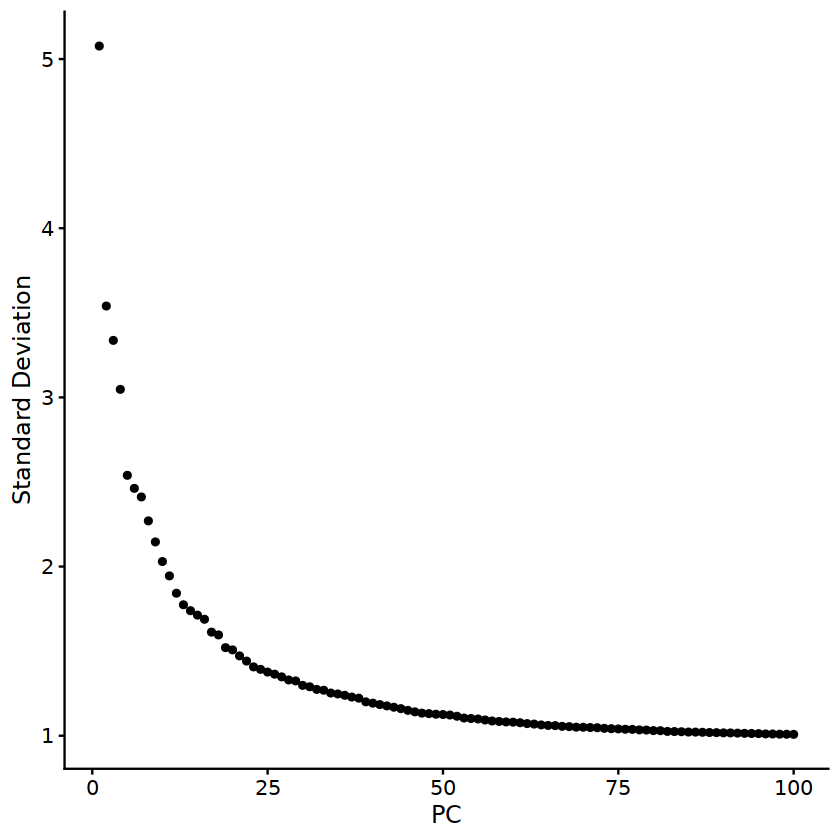

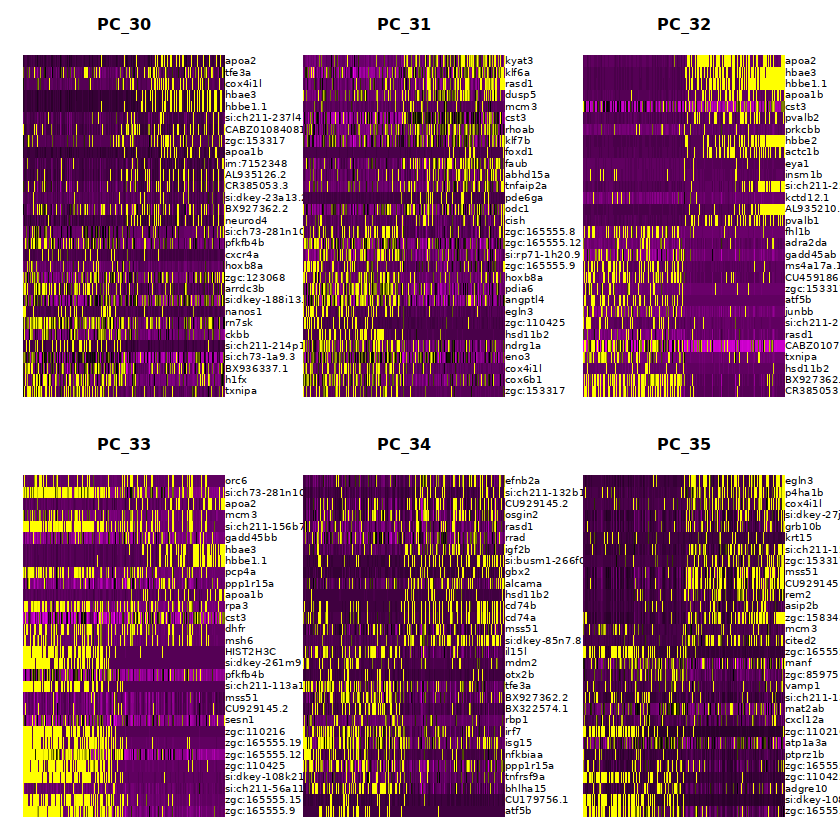

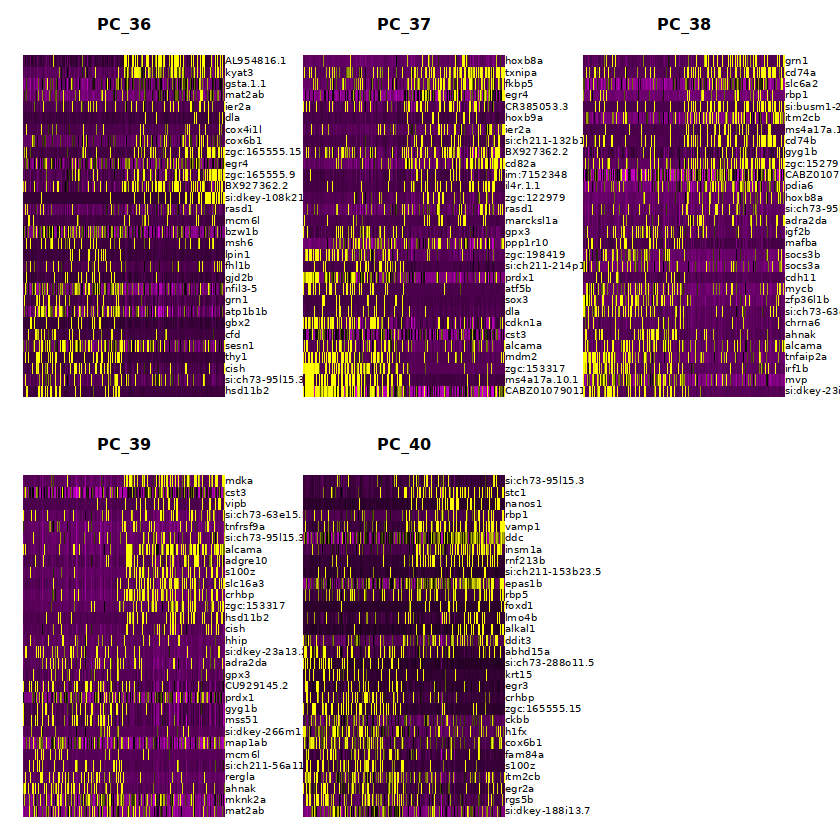

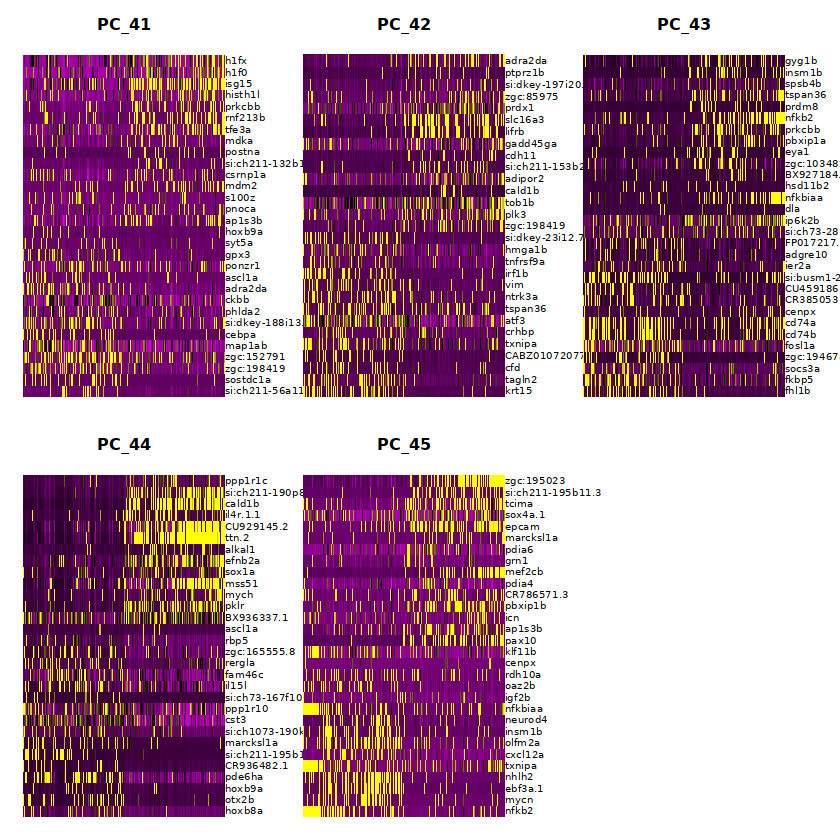

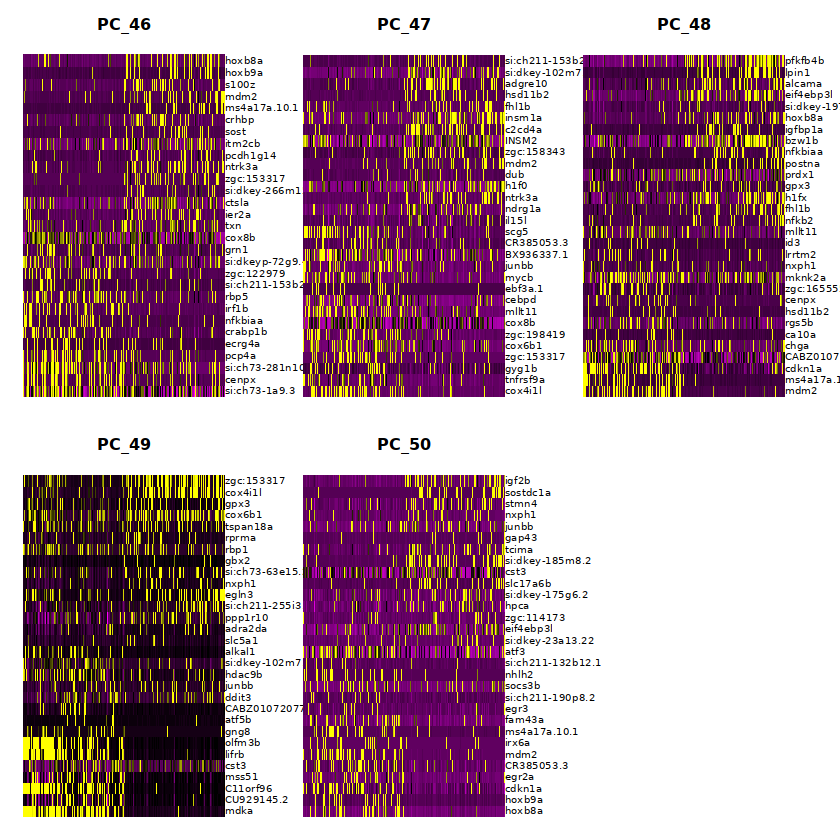

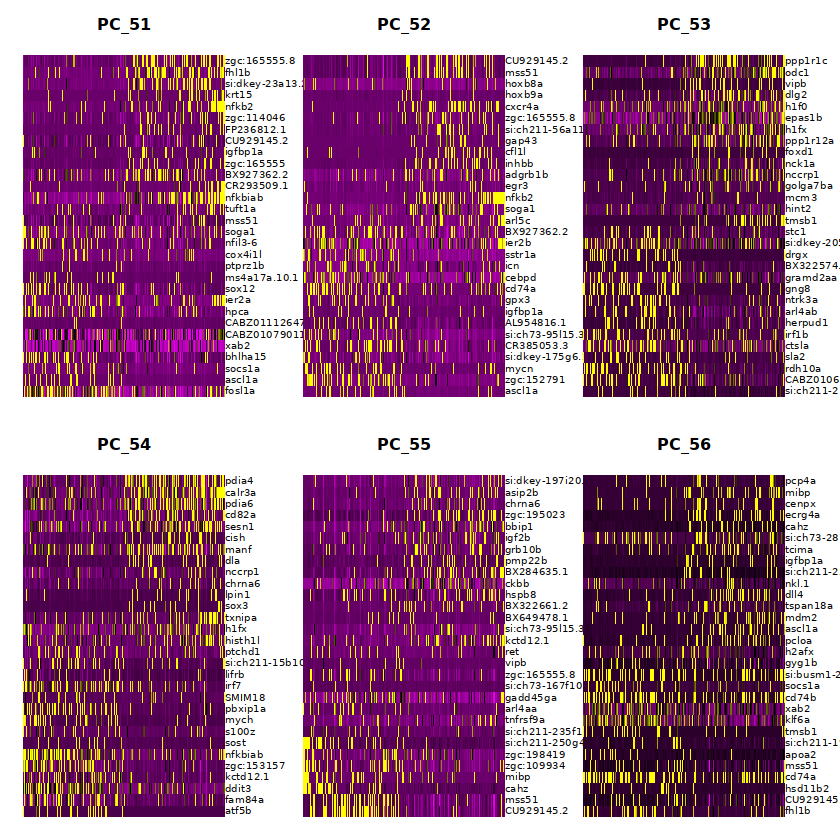

In [160]:
# Run PCA
dat_sub <- RunPCA(dat_sub, features = var_feats, npcs= 100)

# Plot to determine number of PCs
ElbowPlot(object = dat_sub, ndims = 100)
DimHeatmap(object = dat_sub, dims = 30:35, cells = 500, balanced = TRUE)
DimHeatmap(object = dat_sub, dims = 36:40, cells = 500, balanced = TRUE)
DimHeatmap(object = dat_sub, dims = 41:45, cells = 500, balanced = TRUE)
DimHeatmap(object = dat_sub, dims = 46:50, cells = 500, balanced = TRUE)
DimHeatmap(object = dat_sub, dims = 51:56, cells = 500, balanced = TRUE)


In [161]:
ndims <- 50

In [162]:
# Clustering and UMAP
k <- round(max(20,sqrt(ncol(dat_sub)))/4)
if(k %% 2 == 0) {k <- k+1}
if(k > 41) {k <- 41}

dat_sub <- FindNeighbors(object = dat_sub, dims = 1:ndims, k.param = k)
dat_sub <- FindClusters(object = dat_sub, resolution = 0.8)

dat_sub <- RunUMAP(dat_sub, reduction = "pca", dims = 1:ndims)
dat_sub <- RunTSNE(dat_sub, reduction = "pca", dims = 1:ndims)

save(dat_sub, file = paste0(outwd, dat_name,"_nrblstm_clustered.Robj"))

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 101922
Number of edges: 6290201

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9317
Number of communities: 156
Elapsed time: 63 seconds


120 singletons identified. 36 final clusters.

19:54:08 UMAP embedding parameters a = 0.9922 b = 1.112

19:54:08 Read 101922 rows and found 50 numeric columns

19:54:08 Using Annoy for neighbor search, n_neighbors = 30

19:54:08 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:54:27 Writing NN index file to temp file /tmp/RtmpHE02WO/file18e486439d196

19:54:27 Searching Annoy index using 1 thread, search_k = 3000

19:55:26 Annoy recall = 100%

19:55:36 Commencing smooth kNN distance calibration using 1 thread

19:55:45 Initializing from normalized Laplacian + noise

19:55:51 Commencing optimization for 200 epochs, with 4944120 positive edges

19:58:51 Optimization finished



#### UMAP plots

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



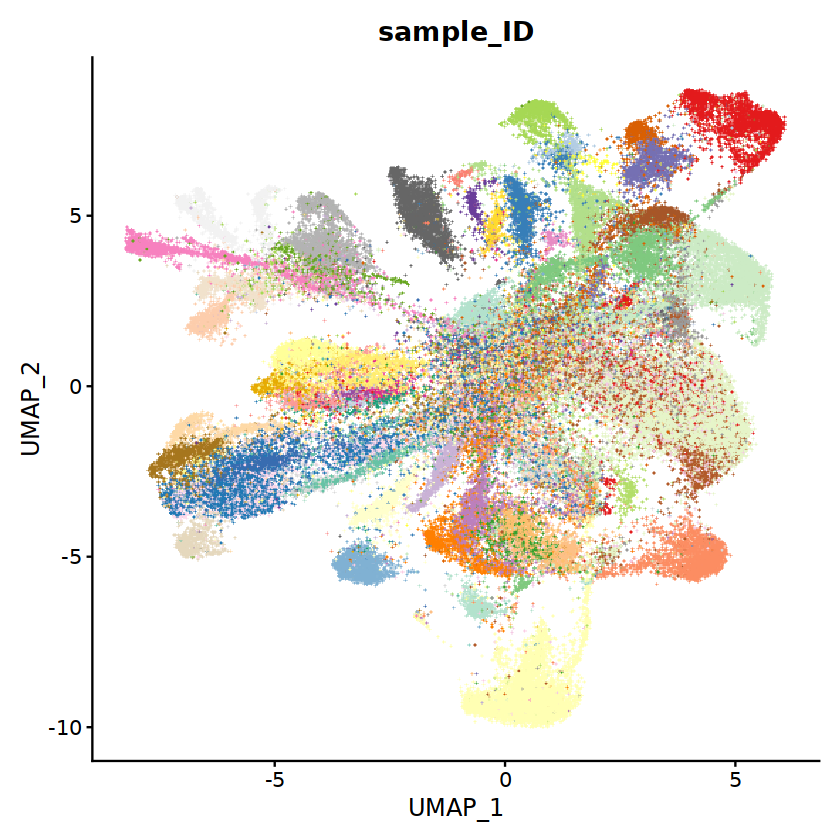

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



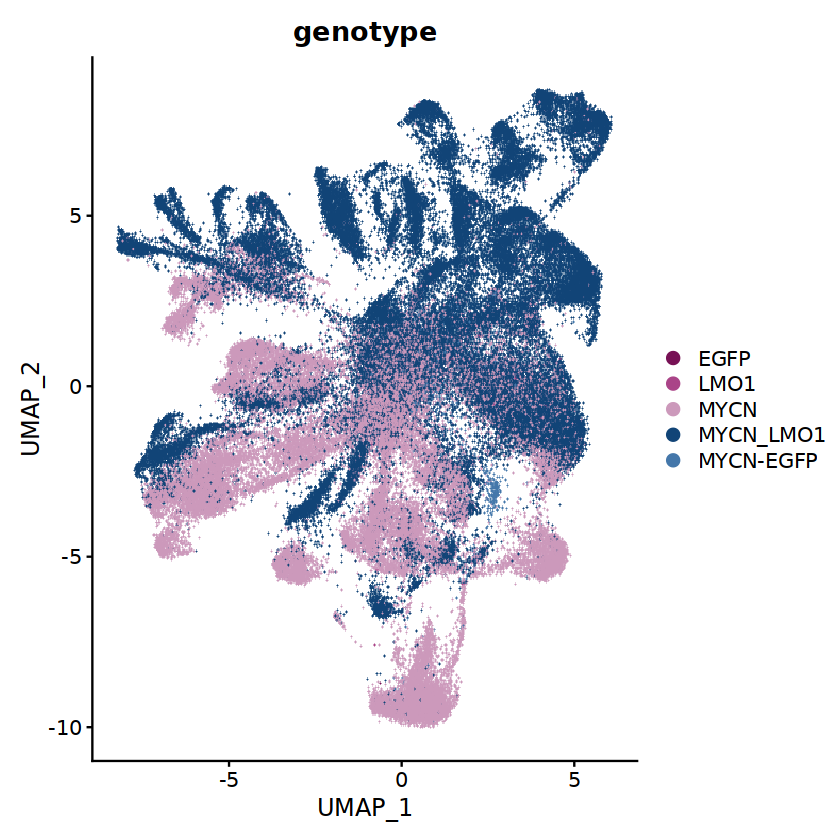

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



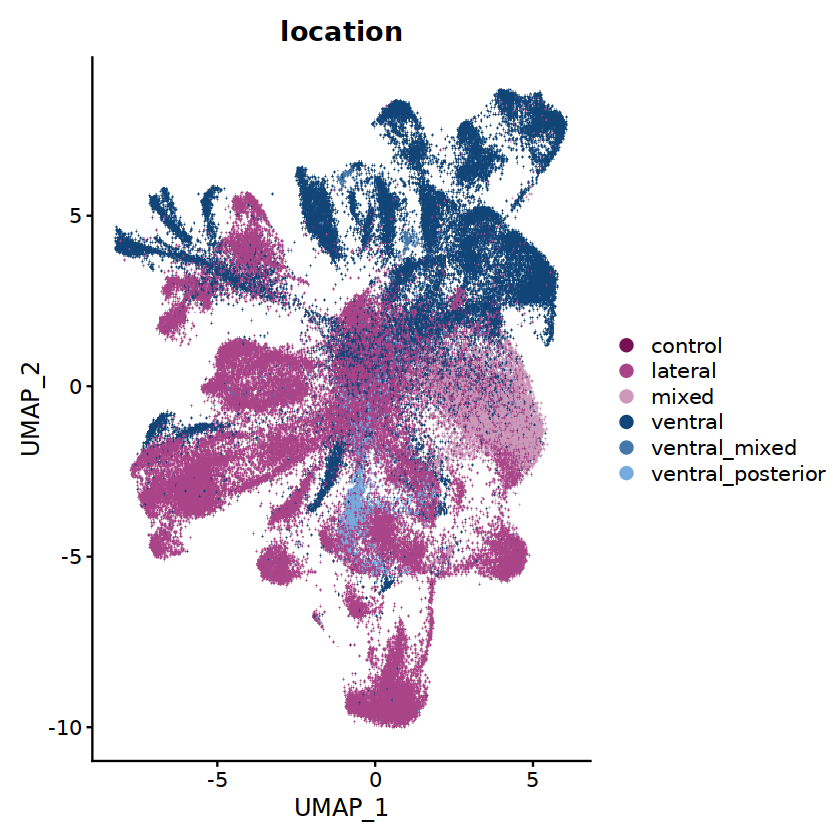

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



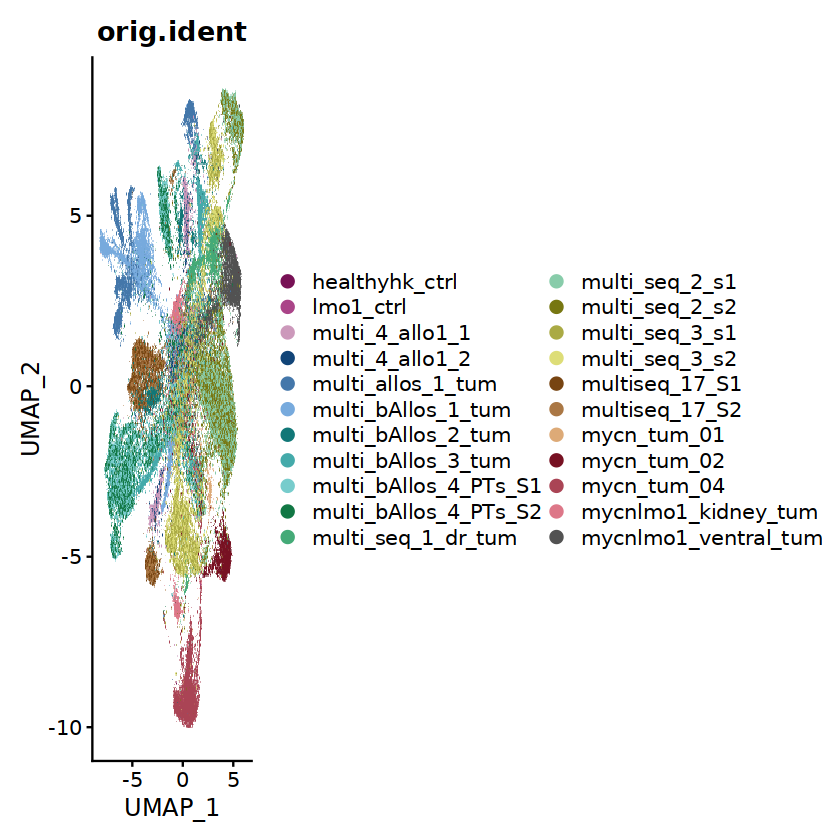

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



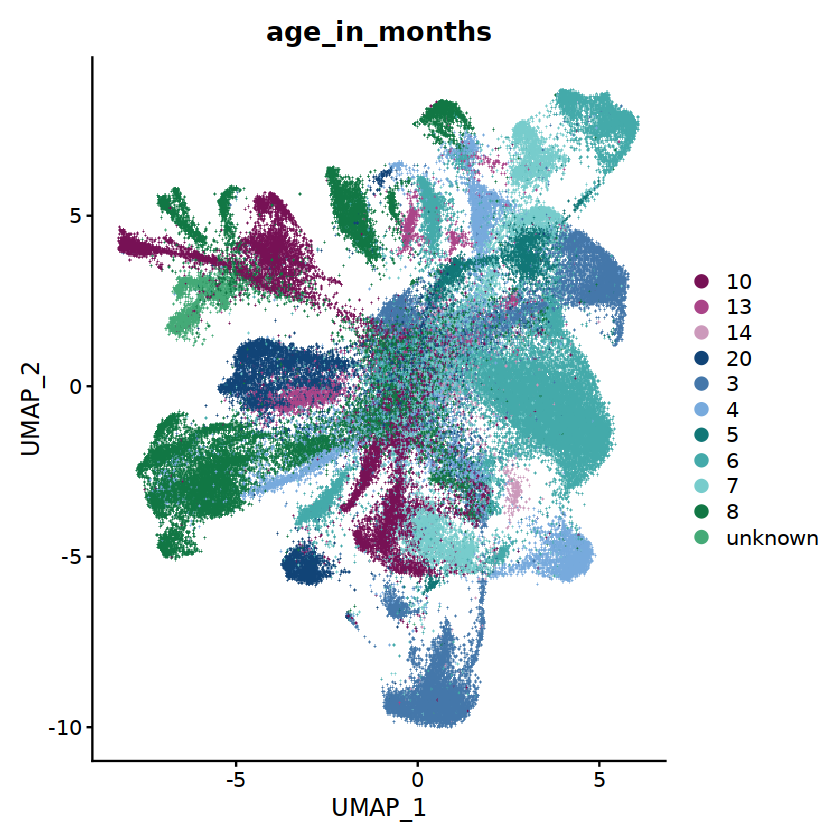

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



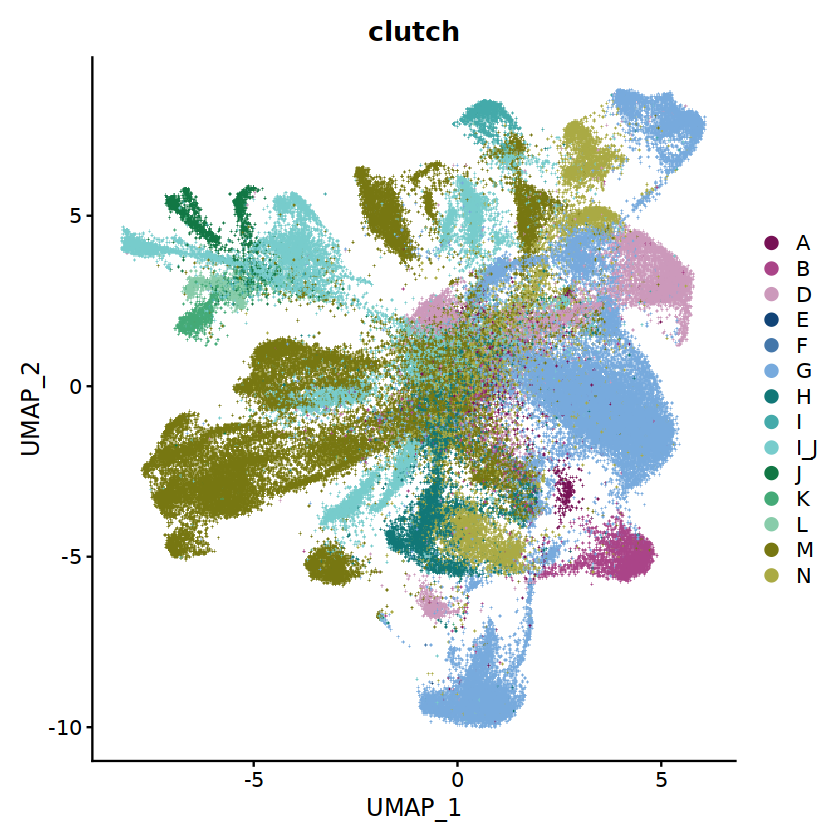

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



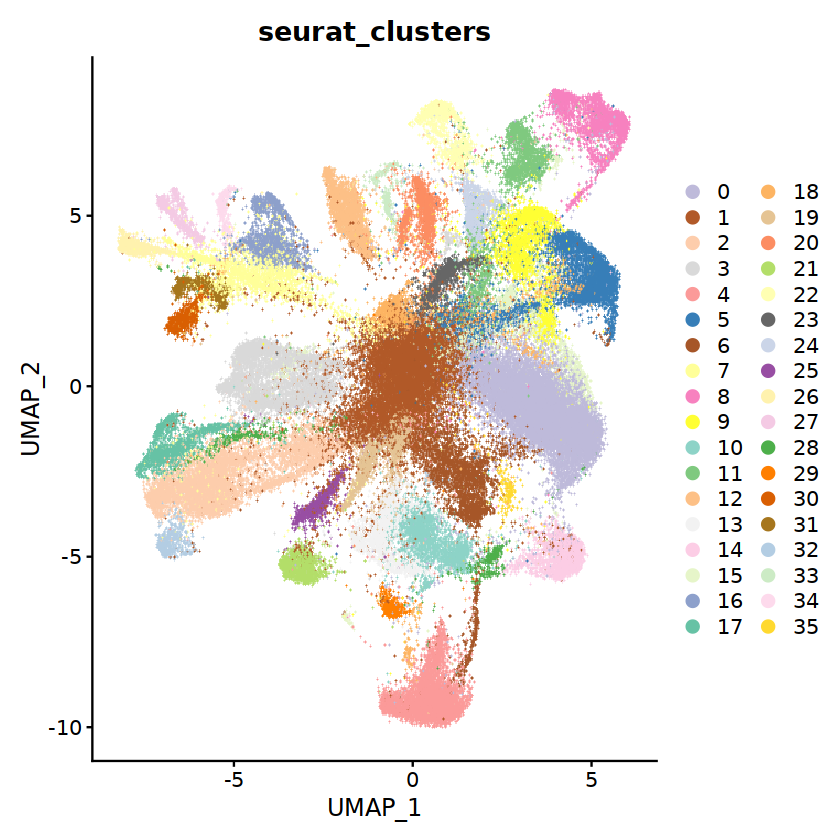

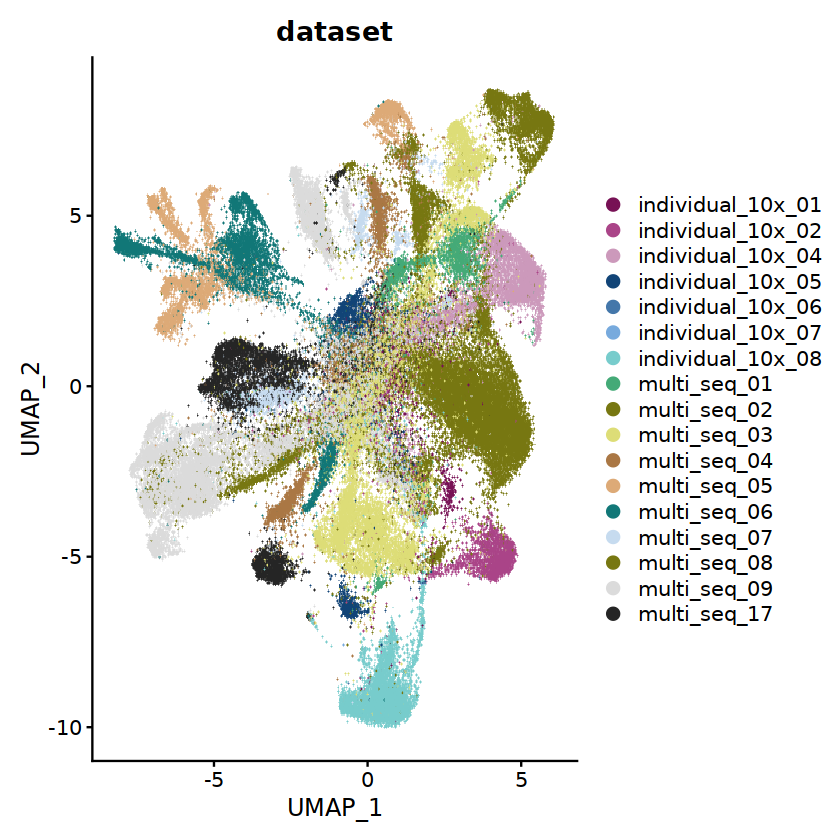

In [198]:

set.seed(156)
n <- length(unique(dat_sub@meta.data$sample_ID))
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector_det = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))
col_vector_det=sample(col_vector_det, n)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "sample_ID", cols = col_vector_det, shuffle = T) + NoLegend()

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "genotype", cols = tol21rainbow, shuffle = T)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "location", cols = tol21rainbow, shuffle = T)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "orig.ident", cols = tol21rainbow, shuffle = T)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "age_in_months", cols = tol21rainbow, shuffle = T)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "clutch", cols = tol21rainbow, shuffle = T)


library(RColorBrewer)
n <- length(unique(dat_sub@meta.data$seurat_clusters))
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector_det = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))
col_vector_det=sample(col_vector_det, n)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "seurat_clusters", cols = col_vector_det, shuffle = T)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, cols = tol21rainbow[c(1,2,3,4,5,6,9,11,13,15,17,18,7,25,13,28,24,28,29,30,31,32)], group.by = "dataset", shuffle = T)


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



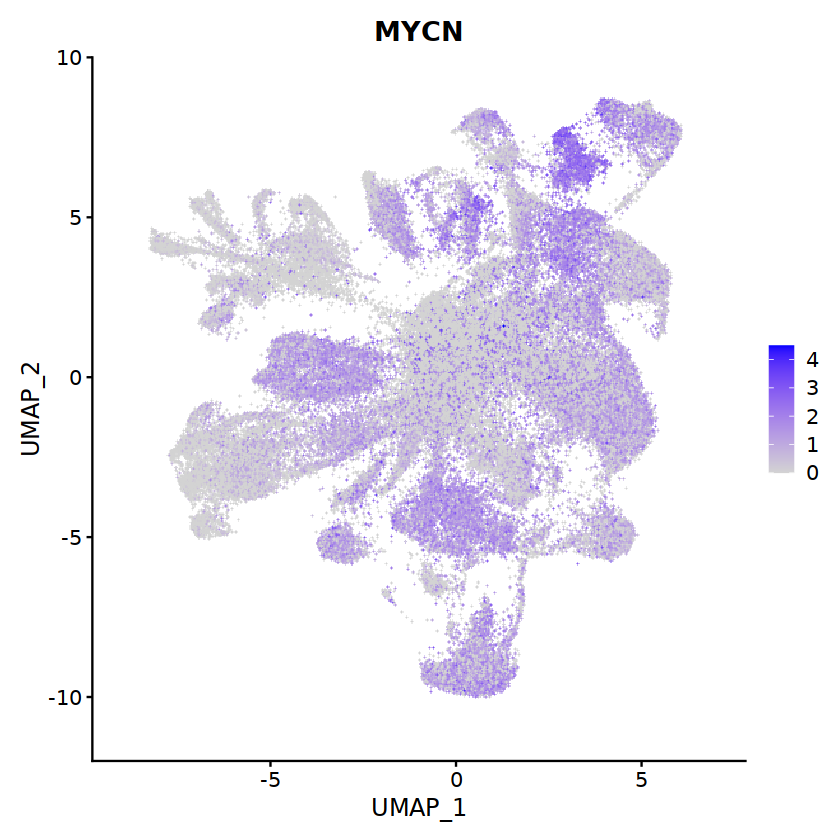

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



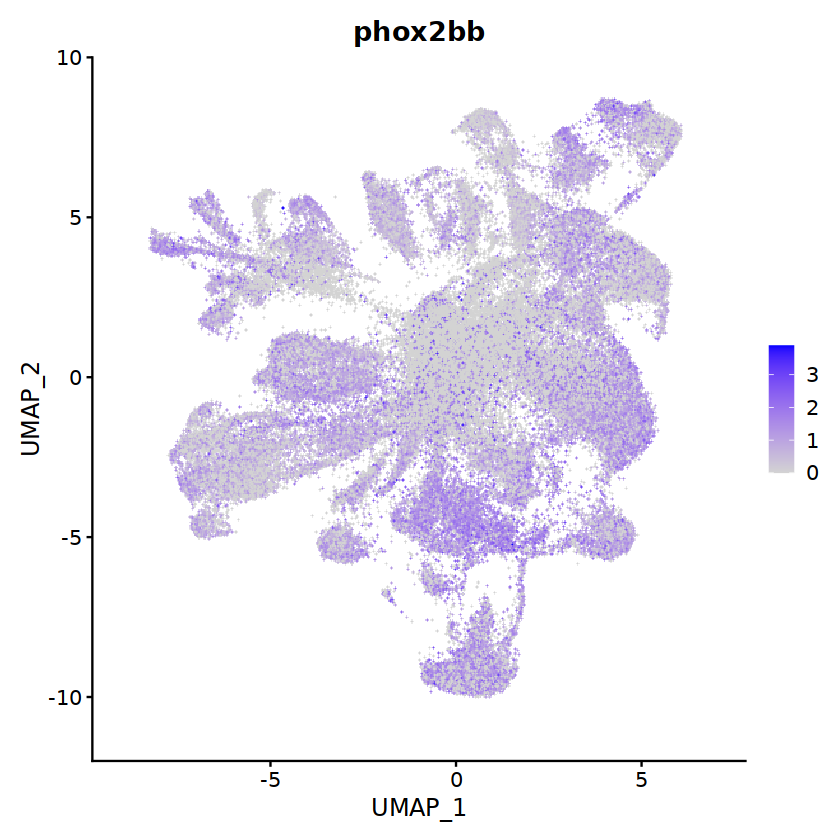

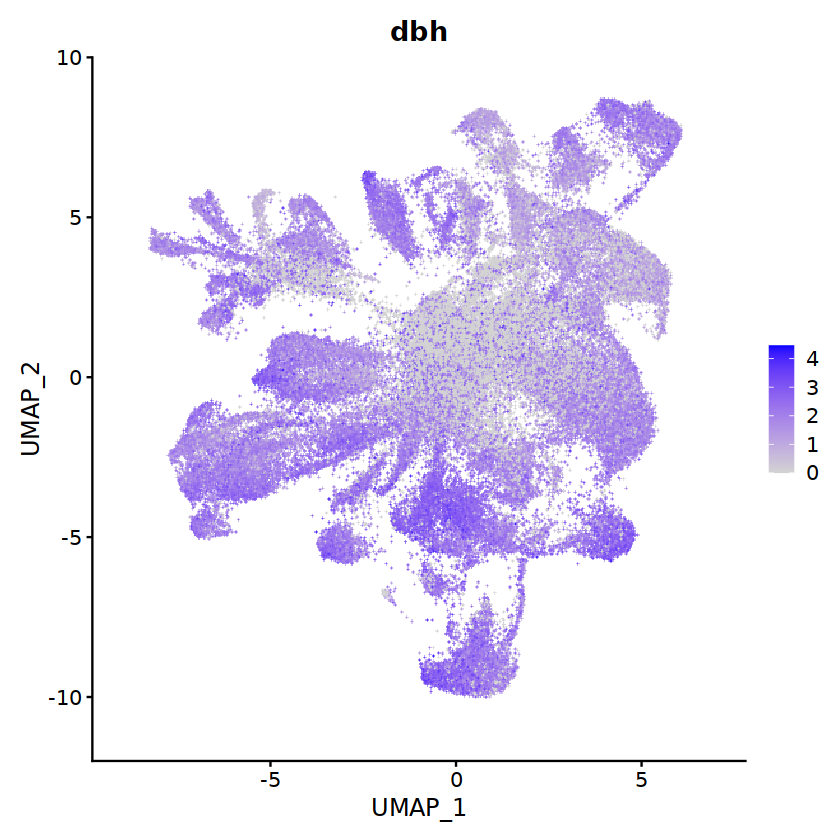

In [184]:
FeaturePlot(object = dat_sub, reduction = 'umap', pt.size = 0.45, features = 'MYCN')

FeaturePlot(object = dat_sub, reduction = 'umap', pt.size = 0.45, features = 'phox2bb')

FeaturePlot(object = dat_sub, reduction = 'umap', pt.size = 0.45, features = 'dbh')


##### Focused in on one dataset
Plots used for Figure 2A

In [186]:
dat_sub$single_dataset <- as.character(dat_sub$dataset)
dat_sub$single_dataset[dat_sub$single_dataset != 'multi_seq_03'] <- 'Other'
dat_sub$single_dataset <- factor(dat_sub$single_dataset, levels = c('Other','multi_seq_03'))

dat_sub$single_sample <- as.character(dat_sub$sample_ID)
dat_sub$single_sample[dat_sub$single_sample != 'MYCN_LMO1_vent_m3_1'] <- 'Other'
dat_sub$single_sample <- factor(dat_sub$single_sample, levels = c('Other','MYCN_LMO1_vent_m3_1'))

dat_sub$ct_plot <- 'NB'

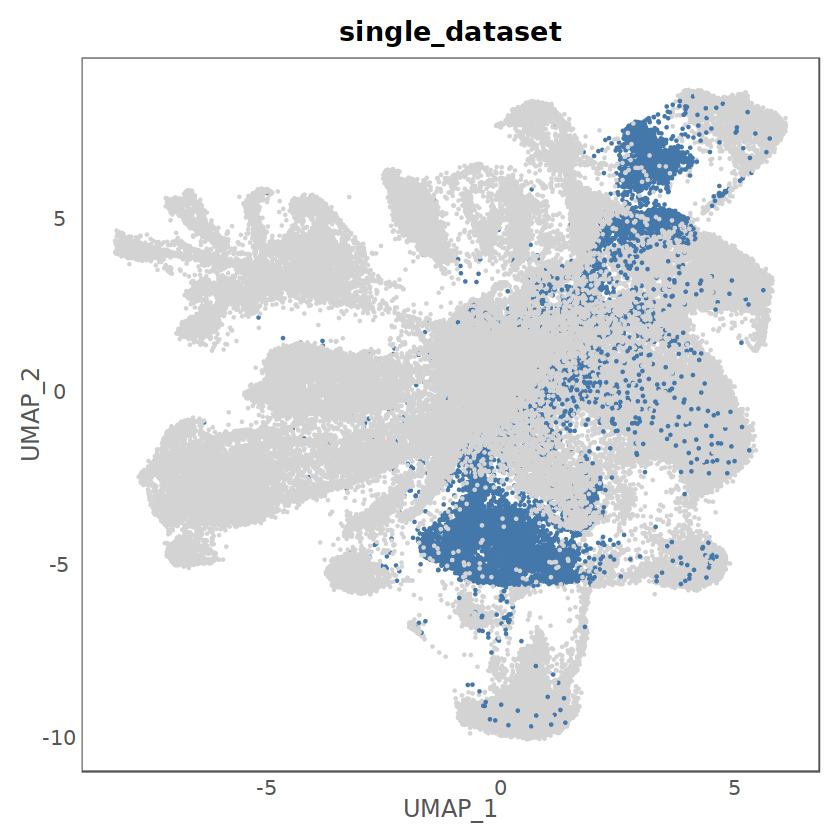

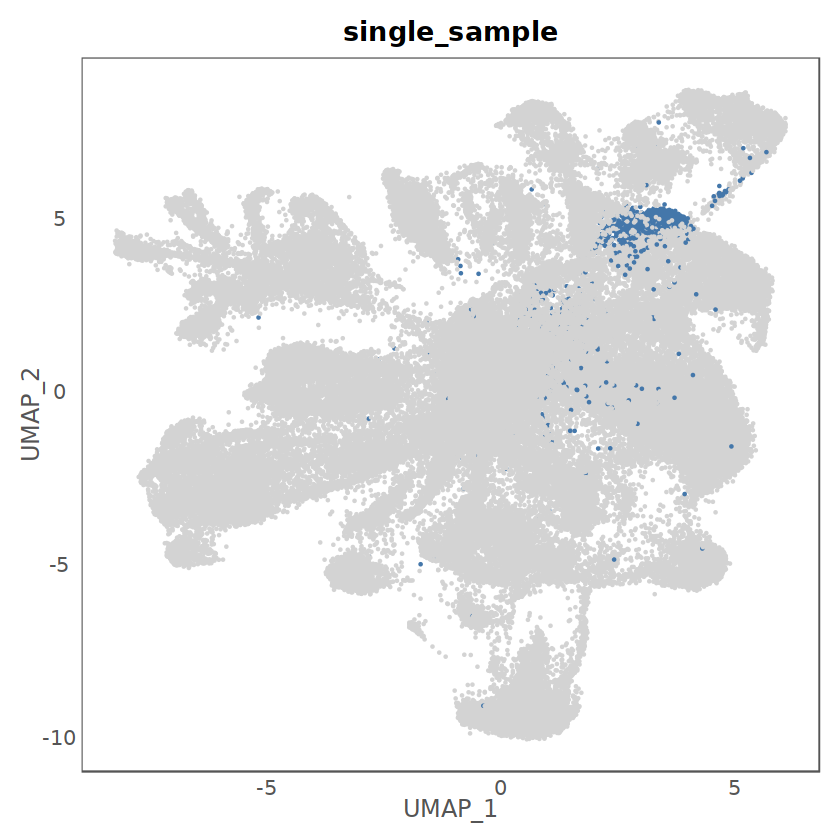

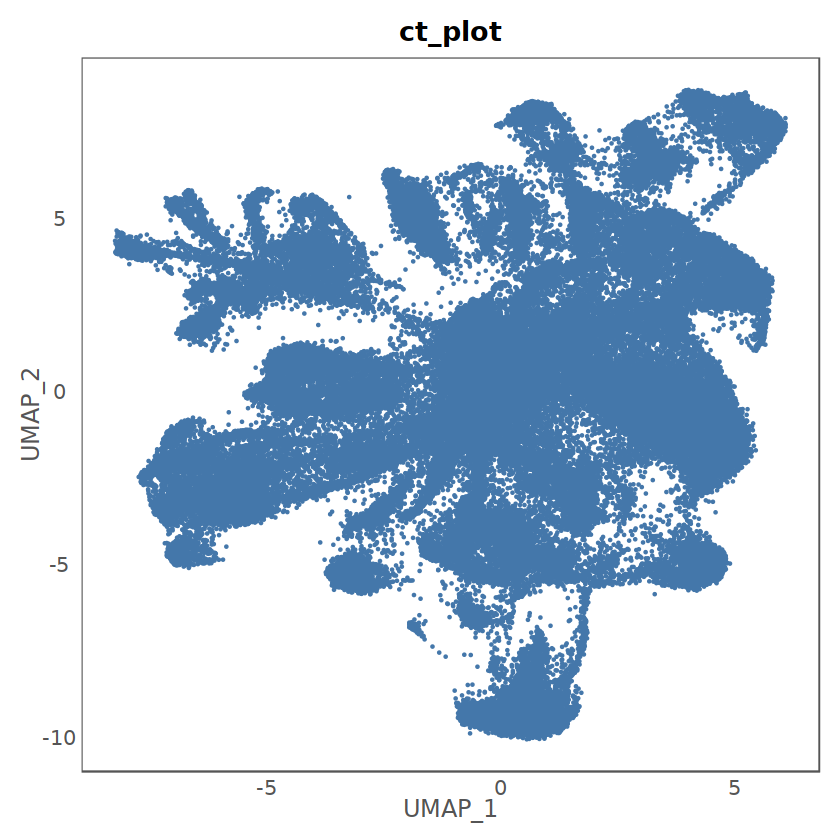

In [190]:
# One MULTI-seq dataset
DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.25, cols = c('light grey', tol21rainbow[5]), group.by = "single_dataset", order = F, raster=FALSE) +
                     NoLegend() +
                     NoAxes() +
                     mytheme_angledYtitle

# One tumor sample
DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.25, cols = c('light grey', tol21rainbow[5]), group.by = "single_sample", order = F, raster=FALSE) +
                     NoLegend() +
                     NoAxes() +
                     mytheme_angledYtitle

# All cells labelled
DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.25, cols = c(tol21rainbow[5]), group.by = "ct_plot", order = F, raster=FALSE) +
                     NoLegend() +
                     NoAxes() +
                     mytheme_angledYtitle


#### Find cluster markers

In [ ]:
Idents(dat_sub)<- "seurat_clusters"

nb_markers <- FindAllMarkers(object = dat_sub, only.pos = TRUE, min.pct = 0.4, logfc.threshold = 0.6)

# Then print
write.csv(nb_markers, file = paste0("./celltype_assign_files/clusterMarkersAll_",sub_dat_name,"_nrblstmCells_seurclusts_minpct40_logfct_60.csv"))


#### Annotate cell types

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



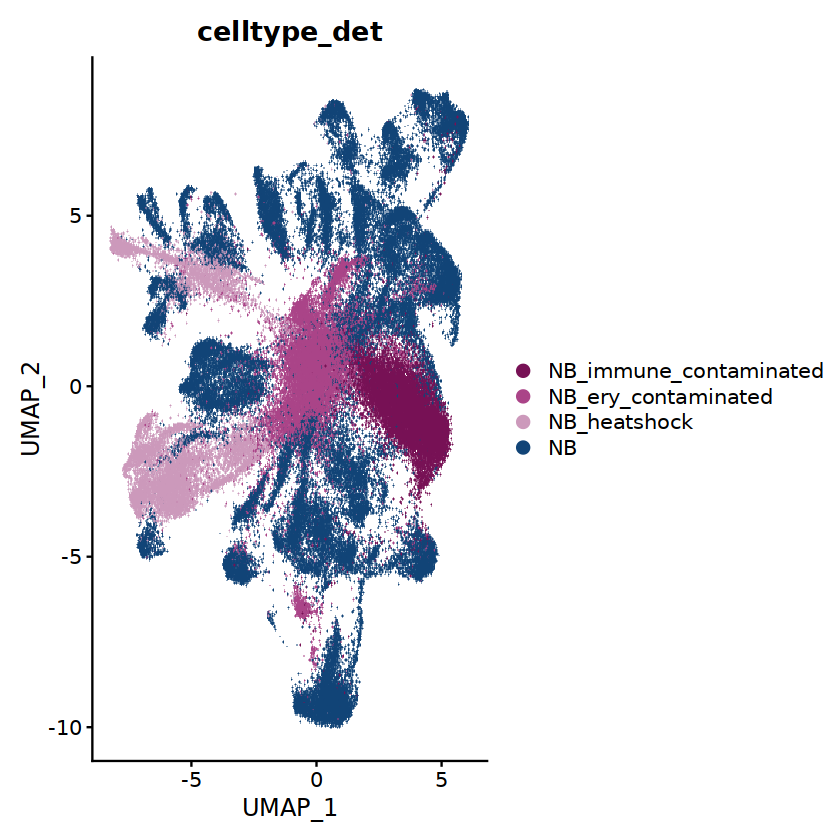

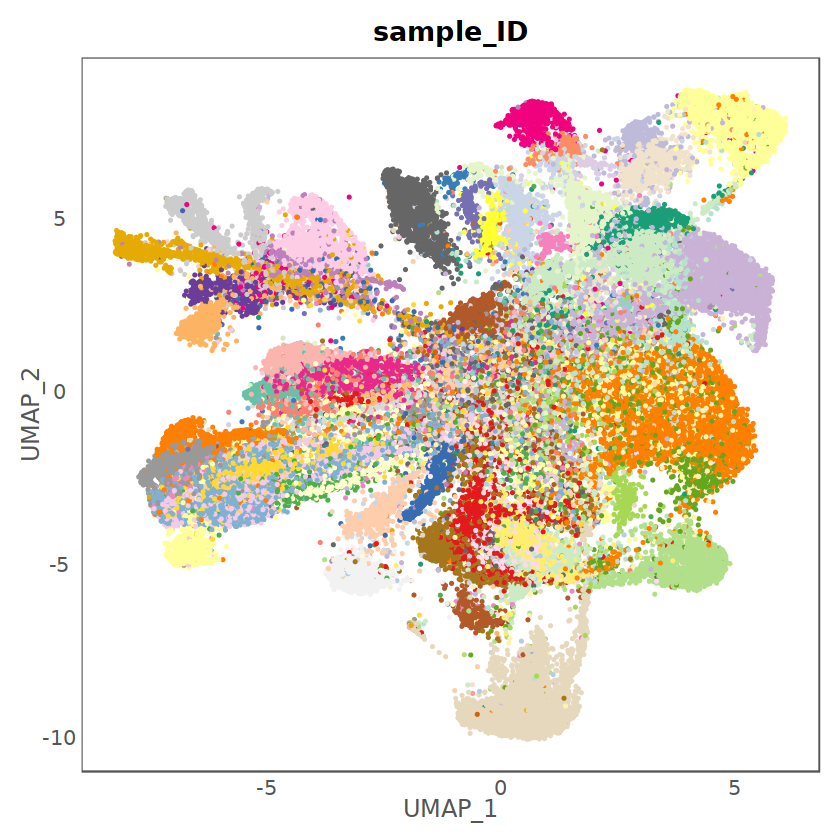

In [195]:

Idents(dat_sub) <- "seurat_clusters"
dat_sub <- RenameIdents(object = dat_sub,
                        '0' = 'NB_immune_contaminated',
                        '1' = 'NB_ery_contaminated',
                        '2' = 'NB_heatshock',
                        '3' = 'NB',
                        '4' = 'NB',
                        '5' = 'NB',
                        '6' = 'NB',
                        '7' = 'NB_heatshock',
                        '8' = 'NB',
                        '9' = 'NB',
                        '10' = 'NB',
                        '11' = 'NB',
                        '12' = 'NB',
                        '13' = 'NB',
                        '14' = 'NB',
                        '15' = 'NB',
                        '16' = 'NB',
                        '17' = 'NB_heatshock',
                        '18' = 'NB_ery_contaminated',
                        '19' = 'NB',
                        '20' = 'NB',
                        '21' = 'NB',
                        '22' = 'NB',
                        '23' = 'NB_ery_contaminated',
                        '24' = 'NB',
                        '25' = 'NB',
                        '26' = 'NB_heatshock',
                        '27' = 'NB',
                        '28' = 'NB',
                        '29' = 'NB_ery_contaminated',
                        '30' = 'NB',
                        '31' = 'NB',
                        '32' = 'NB',
                        '33' = 'NB',
                        '34' = 'NB',
                        '35' = 'NB'
)

dat_sub$celltype_det <- Idents(dat_sub)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "celltype_det", cols = tol21rainbow, shuffle = T)

library(RColorBrewer)
n <- length(unique(dat_sub@meta.data$sample_ID))
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector_det = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))
set.seed(235)
col_vector_det=sample(col_vector_det, n)


DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.4, group.by = "sample_ID", cols = col_vector_det, repel = T, shuffle = T, raster=FALSE) +
                     NoLegend() +
                     NoAxes() +
                     mytheme_angledYtitle

In [ ]:
# save
save(dat_sub, file = paste0(outwd, sub_dat_name,"_clustered.Robj"))

### Subset non-malignant cells and sub-cluster

In [ ]:
sub_dat_name <- "allmerged_final_TME"

dat_name <- "allmerged_final"

# Reload data
load(paste0(outwd, dat_name,"_clustered.Robj"))

In [ ]:
# Subset
Idents(all.comb) <- "celltype"
dat_sub <- subset(all.comb, idents = c("NB","NB_prolif"), invert = T)

rm(all.comb)

#### Process

In [ ]:
# scale all
dat_sub <- NormalizeData(dat_sub)

all.genes <- rownames(x = dat_sub)
dat_sub <- ScaleData(object = dat_sub, features = all.genes,
                     vars.to.regress = c("nCount_RNA", "percent.mt")
                    )


In [ ]:
# Variable features
# Reload genes to regress
to.regress <- read.delim("./data/genestoregress.csv",
  row.names = 1, header = T, stringsAsFactors = F, sep = ',')
to.regress <- to.regress$x

# Load genes associated with the cell cycle that should also be excluded for clustering
to.regress.cellcycle <- read.csv("./zfish_prolif_markers.csv")
to.regress.cellcycle <- as.character(to.regress.cellcycle$x)

dat_sub <- FindVariableFeatures(object = dat_sub,selection.method = 'vst', nfeatures = 2000)
var_feats <- VariableFeatures(object = dat_sub)
var_feats <- var_feats[!var_feats %in% c("mCherry", "EGFP","MYCN", "LMO1", "BIRC5","dTomato")]
var_feats <- var_feats[!var_feats %in% to.regress]
var_feats <- var_feats[!var_feats %in% to.regress.cellcycle]

In [ ]:
# Run PCA
dat_sub <- RunPCA(dat_sub, features = var_feats, npcs= 100)

# Plots
ElbowPlot(object = dat_sub, ndims = 100)
DimHeatmap(object = dat_sub, dims = 30:40, cells = 500, balanced = TRUE)
DimHeatmap(object = dat_sub, dims = 41:50, cells = 500, balanced = TRUE)
DimHeatmap(object = dat_sub, dims = 51:60, cells = 500, balanced = TRUE)


In [207]:
# set dimensions
ndims <- 60

In [ ]:
# Clustering and UMAP
k <- round(max(20,sqrt(ncol(dat_sub)))/4)
if(k %% 2 == 0) {k <- k+1}
if(k > 41) {k <- 41}

dat_sub <- FindNeighbors(object = dat_sub, dims = 1:ndims, k.param = k)
dat_sub <- FindClusters(object = dat_sub, resolution = 1.1)

dat_sub <- RunUMAP(dat_sub, reduction = "pca", dims = 1:ndims)
dat_sub <- RunTSNE(dat_sub, reduction = "pca", dims = 1:ndims)

save(dat_sub, file = paste0(outwd, sub_dat_name,"_clustered.Robj"))

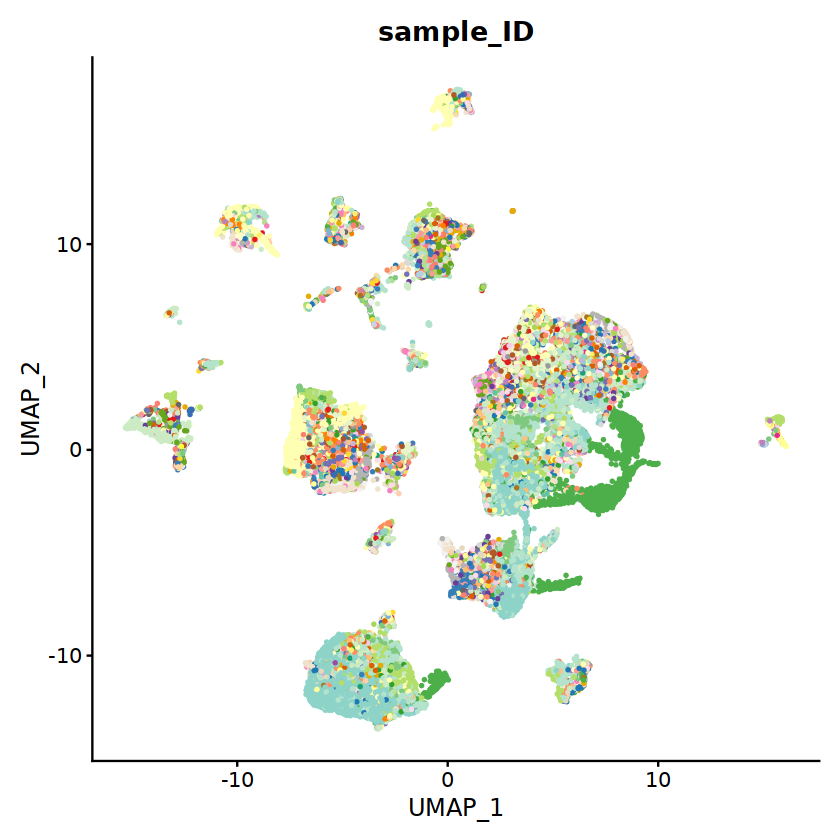

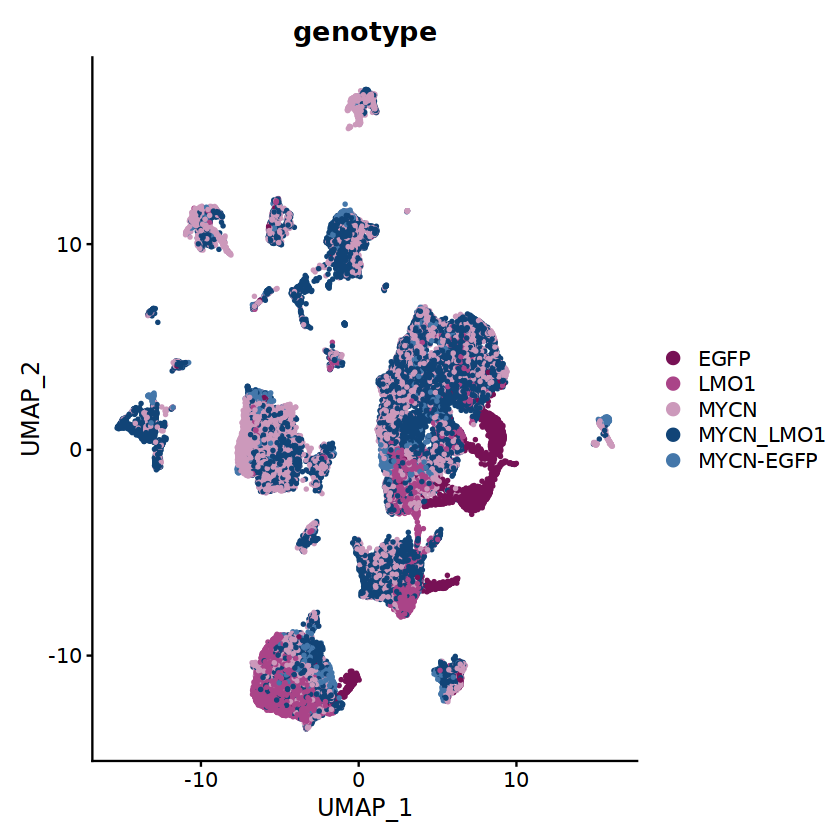

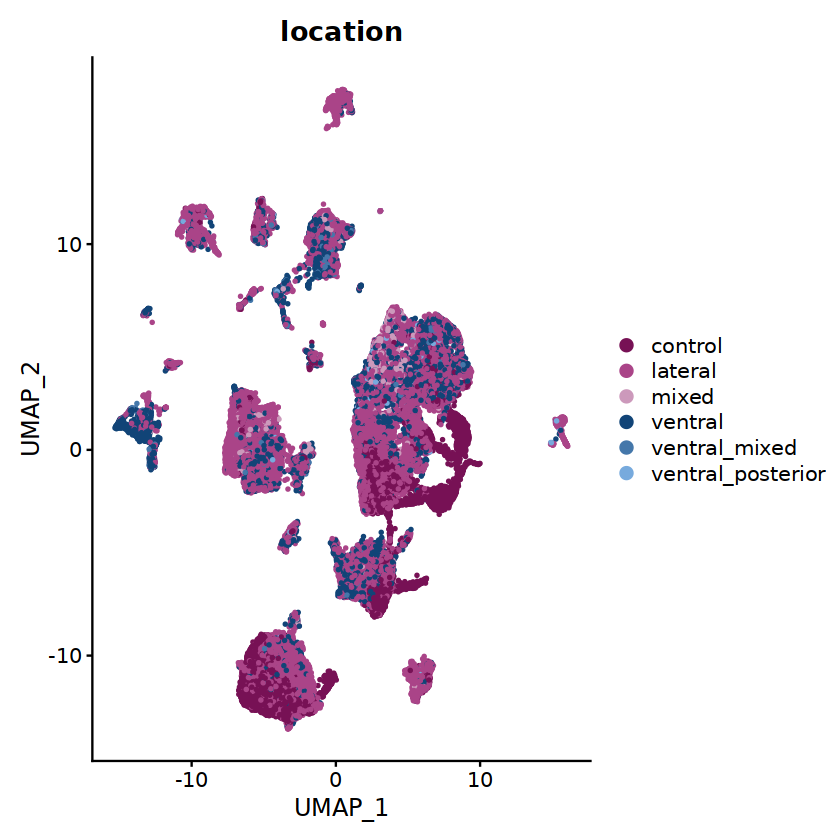

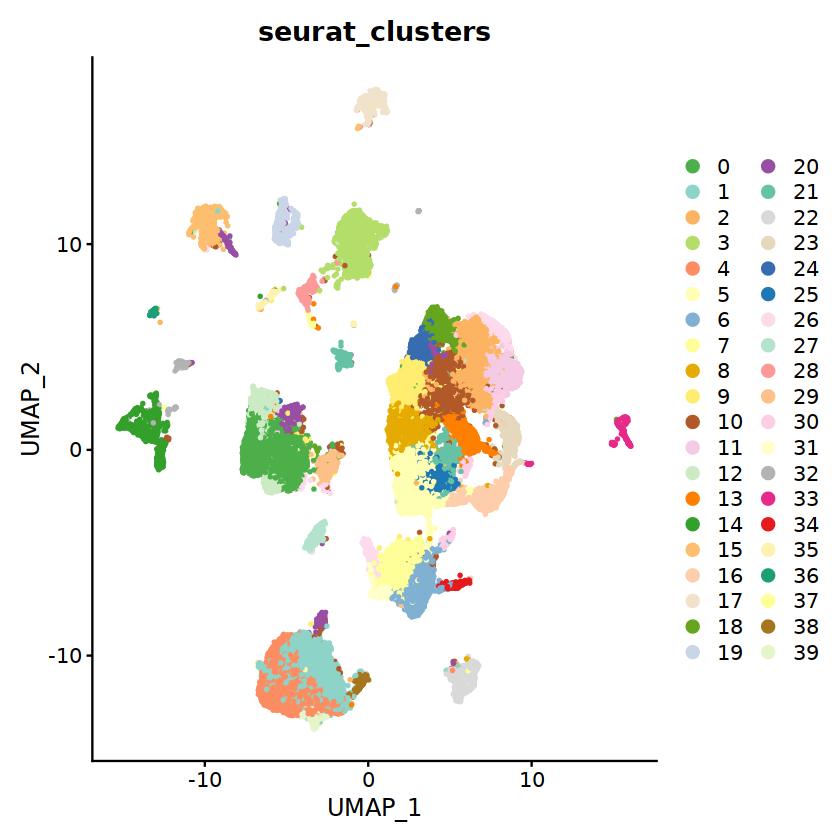

In [210]:
# Plot

set.seed(156)
n <- length(unique(dat_sub@meta.data$sample_ID))
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector_det = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))
col_vector_det=sample(col_vector_det, n)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "sample_ID", cols = col_vector_det, shuffle = T) + NoLegend()

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "genotype", cols = tol21rainbow, shuffle = T)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "location", cols = tol21rainbow, shuffle = T)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "seurat_clusters", cols = col_vector_det, shuffle = T)


#### Find cluster markers

In [ ]:
Idents(dat_sub)<- "seurat_clusters"

tme_markers <- FindAllMarkers(object = dat_sub, only.pos = TRUE, min.pct = 0.4, logfc.threshold = 0.7)

# Then print
write.csv(tme_markers, file = paste0("./celltype_assign_files/clusterMarkersAll_",sub_dat_name,"_seurclusts_minpct40_logfct_70.csv"))


#### Annotate cell types

In [211]:
sub_dat_name <- "allmerged_final_TME"

dat_name <- "allmerged_final"


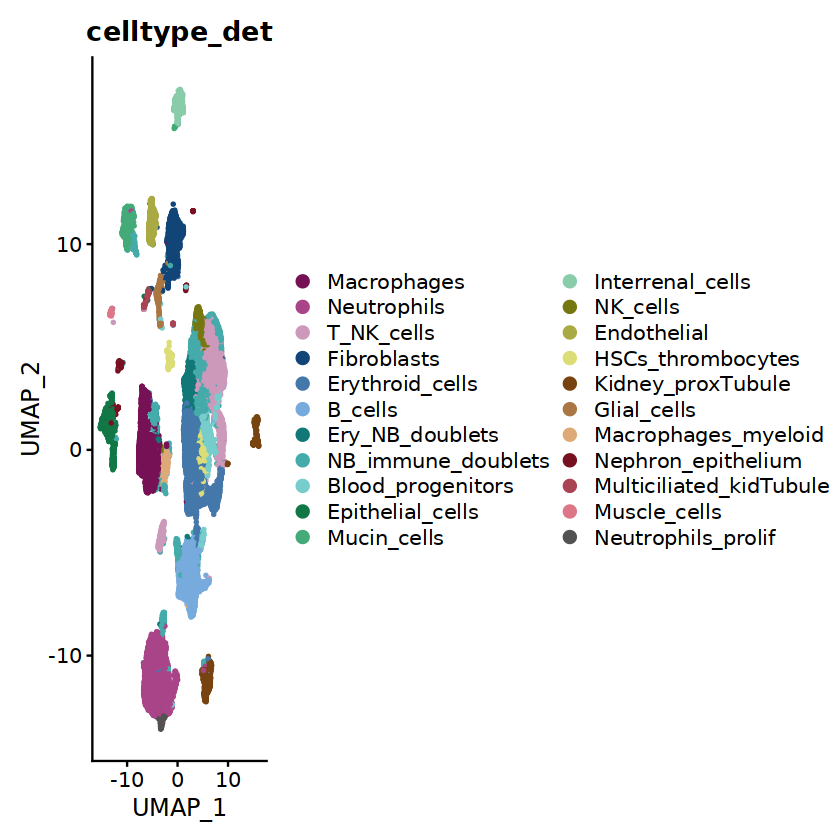

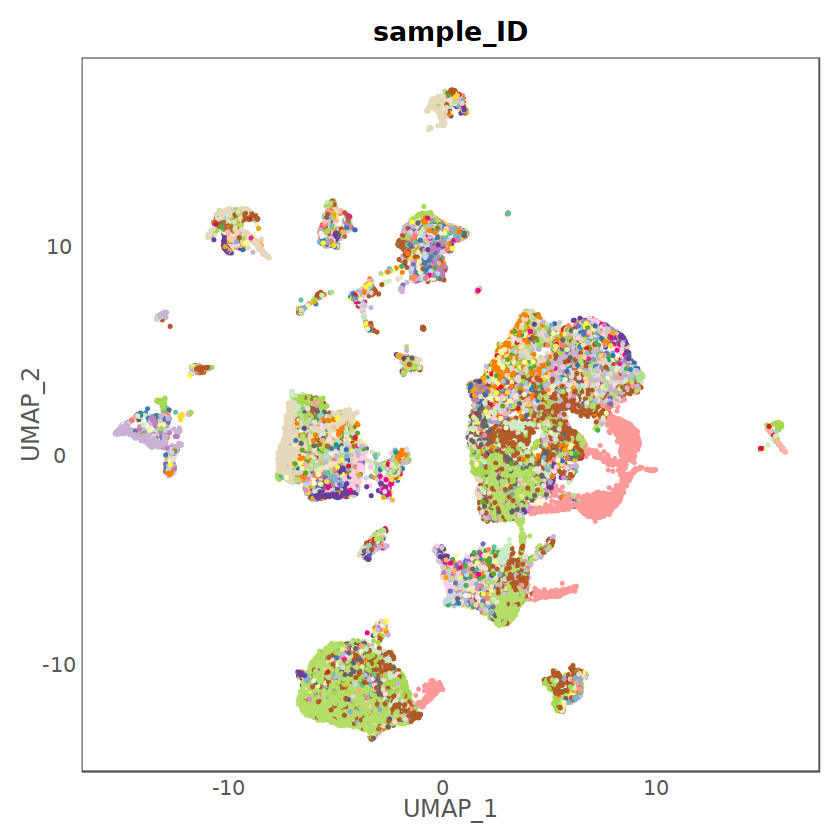

In [213]:

Idents(dat_sub) <- "seurat_clusters"
dat_sub <- RenameIdents(object = dat_sub,
                        '0' = 'Macrophages',
                        '1' = 'Neutrophils',
                        '2' = 'T_NK_cells',
                        '3' = 'Fibroblasts',
                        '4' = 'Neutrophils',
                        '5' = 'Erythroid_cells',
                        '6' = 'B_cells',
                        '7' = 'B_cells',
                        '8' = 'Erythroid_cells',
                        '9' = 'Ery_NB_doublets',
                        '10' = 'NB_immune_doublets',
                        '11' = 'T_NK_cells',
                        '12' = 'Macrophages',
                        '13' = 'Blood_progenitors',
                        '14' = 'Epithelial_cells',
                        '15' = 'Mucin_cells',
                        '16' = 'Erythroid_cells',
                        '17' = 'Interrenal_cells',
                        '18' = 'NK_cells',
                        '19' = 'Endothelial',
                        '20' = 'NB_immune_doublets',
                        '21' = 'HSCs_thrombocytes',
                        '22' = 'Kidney_proxTubule',
                        '23' = 'T_NK_cells',
                        '24' = 'NB_immune_doublets',
                        '25' = 'Erythroid_cells',
                        '26' = 'NB_immune_doublets',
                        '27' = 'T_NK_cells',
                        '28' = 'Glial_cells',
                        '29' = 'Macrophages_myeloid',
                        '30' = 'Blood_progenitors',
                        '31' = 'B_cells',
                        '32' = 'Nephron_epithelium',
                        '33' = 'Kidney_proxTubule',
                        '34' = 'B_cells',
                        '35' = 'Multiciliated_kidTubule',
                        '36' = 'Muscle_cells',
                        '37' = 'Glial_cells',
                        '38' = 'Neutrophils',
                        '39' = 'Neutrophils_prolif'
)

dat_sub$celltype_det <- Idents(dat_sub)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "celltype_det", cols = tol21rainbow, shuffle = T)

library(RColorBrewer)
n <- length(unique(dat_sub@meta.data$sample_ID))
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector_det = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))
set.seed(235)
col_vector_det=sample(col_vector_det, n)


DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.4, group.by = "sample_ID", cols = col_vector_det, repel = T, shuffle = T, raster=FALSE) +
                     NoLegend() +
                     NoAxes() +
                     mytheme_angledYtitle


In [215]:
# save
save(dat_sub, file = paste0(outwd, sub_dat_name,"_clustered.Robj"))

### Further subset for stromal cells

In [ ]:
load('./data/allmerged_final_TME_clustered.Robj')

sub_dat_name <- "allmerged_final_stromal"

dat_name <- "allmerged_final"

In [ ]:
Idents(dat_sub) <- "celltype_det"
dat_sub <- subset(dat_sub, idents = c('NB_immune_doublets',
                                        'Macrophages',
                                        'Neutrophils',
                                        'NK_cells',
                                        'Erythroid_cells',
                                        'Blood_progenitors',
                                        'T_NK_cells',
                                        'HSCs_thrombocytes',
                                        'Macrophages_myeloid',
                                        'Ery_NB_doublets',
                                        'Neutrophils_prolif',
                                        'B_cells'),
                          invert = T)


#### Process

In [ ]:
# scale all
dat_sub <- NormalizeData(dat_sub)

all.genes <- rownames(x = dat_sub)
dat_sub <- ScaleData(object = dat_sub, features = all.genes,
                     vars.to.regress = c("nCount_RNA", "percent.mt")
                    )


In [ ]:
# Get variable genes
# Reload genes to regress
to.regress <- read.delim("./data/genestoregress.csv",
  row.names = 1, header = T, stringsAsFactors = F, sep = ',')
to.regress <- to.regress$x

# Load genes associated with the cell cycle that should also be excluded for clustering
to.regress.cellcycle <- read.csv("./zfish_prolif_markers.csv")
to.regress.cellcycle <- as.character(to.regress.cellcycle$x)

dat_sub <- FindVariableFeatures(object = dat_sub,selection.method = 'vst', nfeatures = 2000)
var_feats <- VariableFeatures(object = dat_sub)
var_feats <- var_feats[!var_feats %in% c("mCherry", "EGFP","MYCN", "LMO1", "BIRC5","dTomato")]
var_feats <- var_feats[!var_feats %in% to.regress]
var_feats <- var_feats[!var_feats %in% to.regress.cellcycle]


In [ ]:
# PCA
dat_sub <- RunPCA(dat_sub, features = var_feats, npcs= 100)

# plots for determining number of PCs
ElbowPlot(object = dat_sub, ndims = 100)
DimHeatmap(object = dat_sub, dims = 30:40, cells = 500, balanced = TRUE)
DimHeatmap(object = dat_sub, dims = 41:50, cells = 500, balanced = TRUE)


In [217]:
# Set dimensions
ndims <- 50


In [ ]:
# Clustering and UMAP
k <- round(max(20,sqrt(ncol(dat_sub)))/4)
if(k %% 2 == 0) {k <- k+1}
if(k > 41) {k <- 41}

dat_sub <- FindNeighbors(object = dat_sub, dims = 1:ndims, k.param = k)
dat_sub <- FindClusters(object = dat_sub, resolution = 1.1)

dat_sub <- RunUMAP(dat_sub, reduction = "pca", dims = 1:ndims)
dat_sub <- RunTSNE(dat_sub, reduction = "pca", dims = 1:ndims)

# save
save(dat_sub, file = paste0(outwd, sub_dat_name,"_clustered.Robj"))

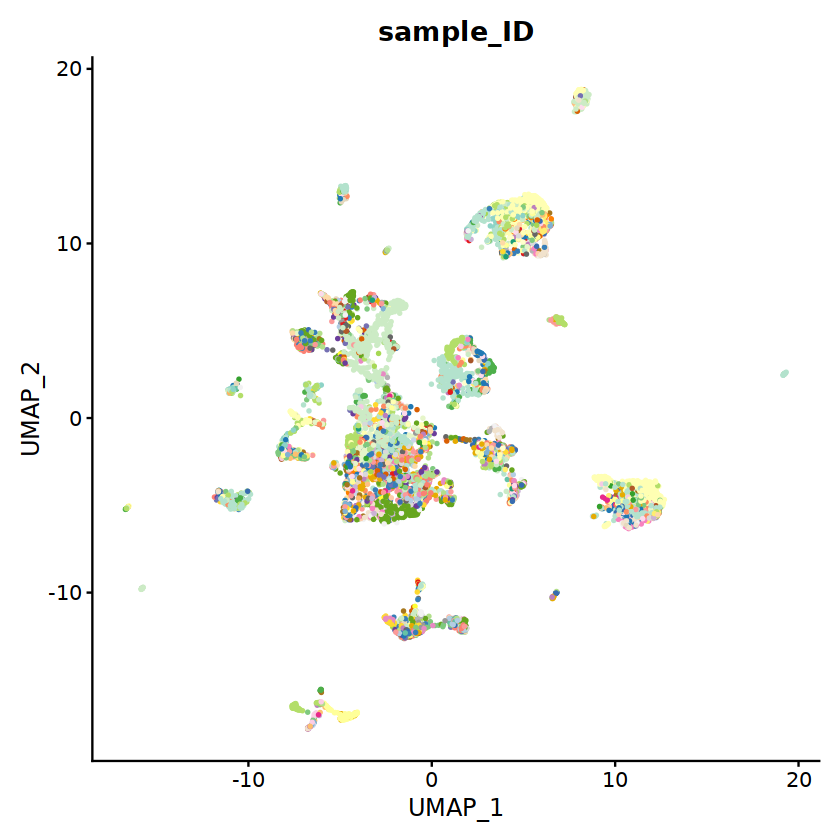

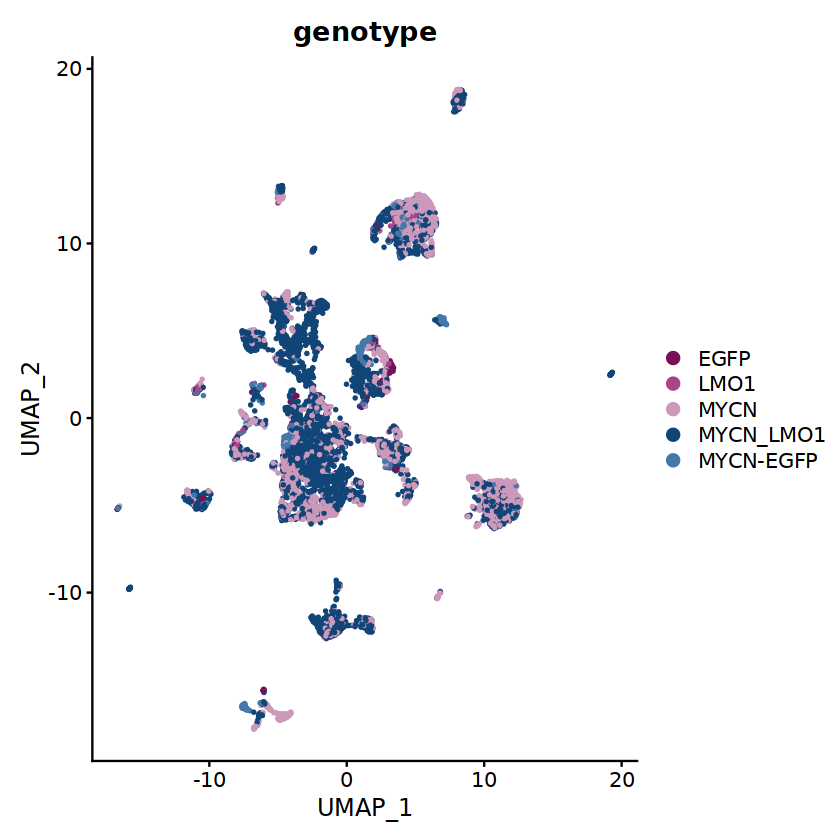

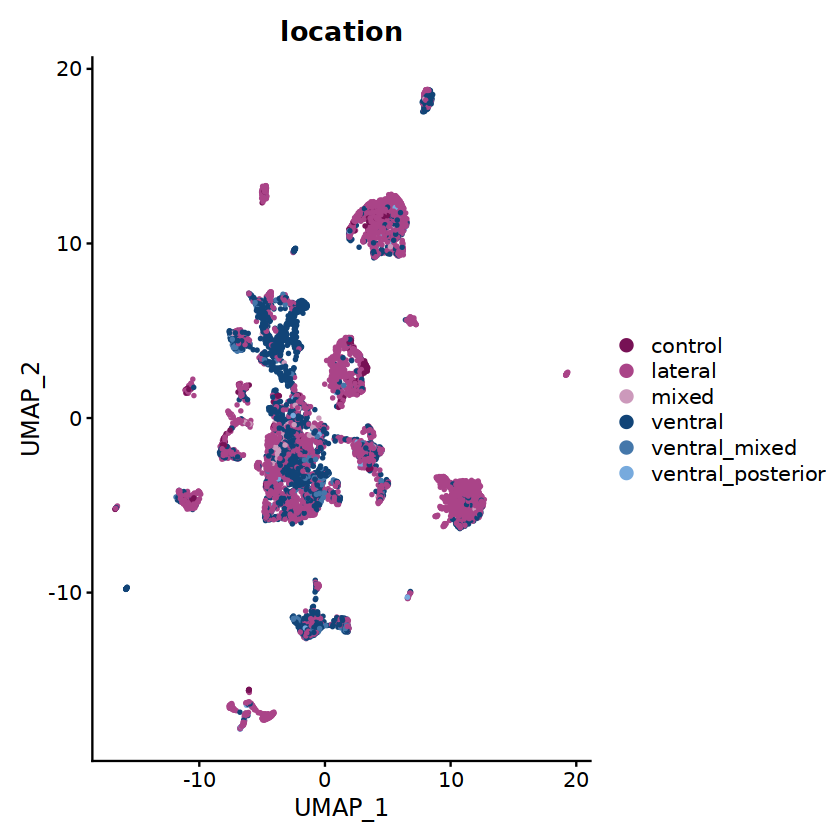

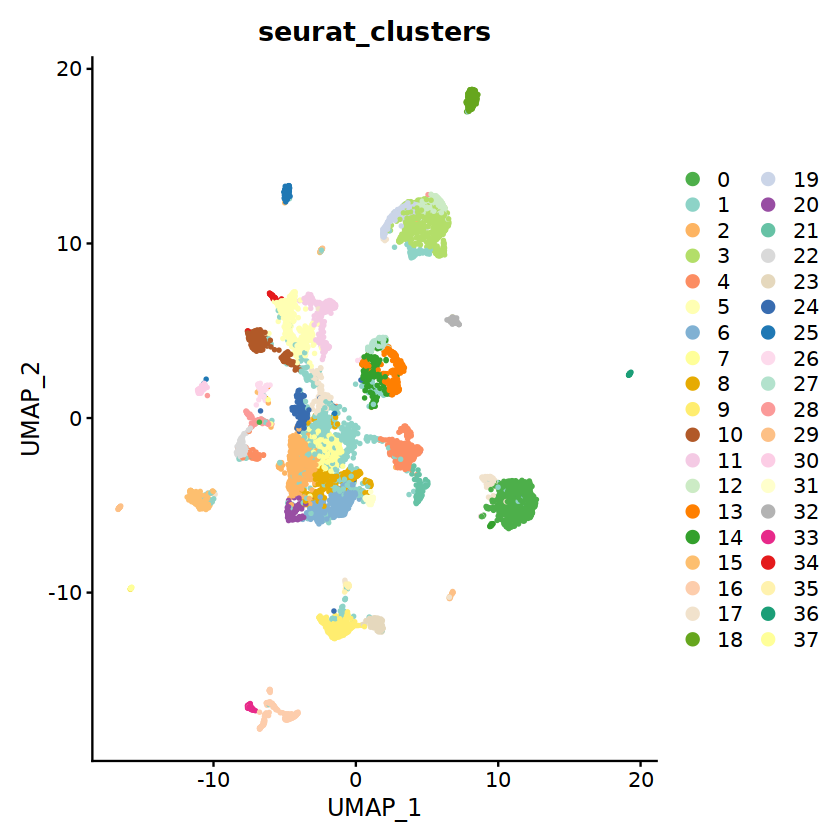

In [219]:
# Plot

set.seed(156)
n <- length(unique(dat_sub@meta.data$sample_ID))
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector_det = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))
col_vector_det=sample(col_vector_det, n)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "sample_ID", cols = col_vector_det, shuffle = T) + NoLegend()

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "genotype", cols = tol21rainbow, shuffle = T)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "location", cols = tol21rainbow, shuffle = T)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "seurat_clusters", cols = col_vector_det, shuffle = T)


#### Find cluster markers

In [ ]:
Idents(dat_sub)<- "seurat_clusters"

stromal_markers <- FindAllMarkers(object = dat_sub, only.pos = TRUE, min.pct = 0.4, logfc.threshold = 0.7)

# Then print
write.csv(stromal_markers, file = paste0("./celltype_assign_files/clusterMarkersAll_",sub_dat_name,"_seurclusts_minpct40_logfct_70.csv"))


#### Annotate cell types

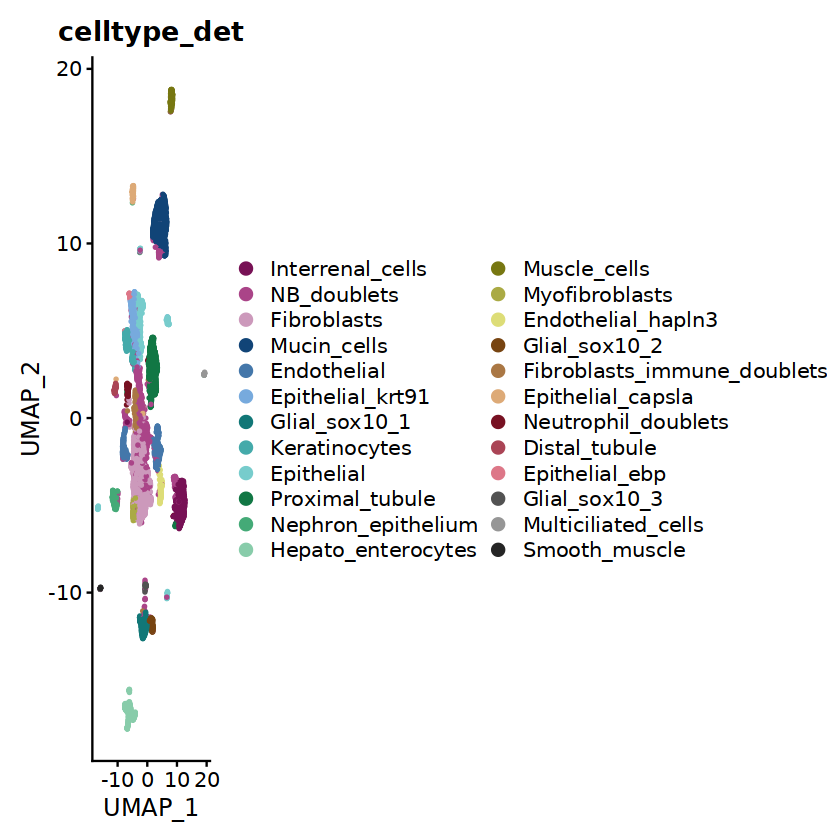

In [220]:

Idents(dat_sub) <- "seurat_clusters"
dat_sub <- RenameIdents(object = dat_sub,
                    '0' = 'Interrenal_cells',
                    '1' = 'NB_doublets',
                    '2' = 'Fibroblasts',
                    '3' = 'Mucin_cells',
                    '4' = 'Endothelial',
                    '5' = 'Epithelial_krt91',
                    '6' = 'Fibroblasts',
                    '7' = 'Fibroblasts',
                    '8' = 'Fibroblasts',
                    '9' = 'Glial_sox10_1',
                    '10' = 'Keratinocytes',
                    '11' = 'Epithelial',
                    '12' = 'Mucin_cells',
                    '13' = 'Proximal_tubule',
                    '14' = 'Proximal_tubule',
                    '15' = 'Nephron_epithelium',
                    '16' = 'Hepato_enterocytes',
                    '17' = 'NB_doublets',
                    '18' = 'Muscle_cells',
                    '19' = 'Mucin_cells',
                    '20' = 'Myofibroblasts',
                    '21' = 'Endothelial_hapln3',
                    '22' = 'Endothelial',
                    '23' = 'Glial_sox10_2',
                    '24' = 'Fibroblasts_immune_doublets',
                    '25' = 'Epithelial_capsla',
                    '26' = 'Neutrophil_doublets',
                    '27' = 'Proximal_tubule',
                    '28' = 'NB_doublets',
                    '29' = 'Epithelial',
                    '30' = 'Distal_tubule',
                    '31' = 'Fibroblasts',
                    '32' = 'Epithelial',
                    '33' = 'Hepato_enterocytes',
                    '34' = 'Epithelial_ebp',
                    '35' = 'Glial_sox10_3',
                    '36' = 'Multiciliated_cells',
                    '37' = 'Smooth_muscle'
)

## Write to metadata
dat_sub$celltype_det <- Idents(dat_sub)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "celltype_det", cols = tol21rainbow, shuffle = T)


In [222]:
# save
save(dat_sub, file = paste0(outwd, sub_dat_name,"_clustered.Robj"))

### Further subset for immune and blood cells

In [224]:
load('./data/allmerged_final_TME_clustered.Robj')

sub_dat_name <- "allmerged_final_immune"

dat_name <- "allmerged_final"

In [ ]:
Idents(dat_sub) <- "celltype_det"
dat_sub <- subset(dat_sub, idents = c('NB_immune_doublets',
                                        'Macrophages',
                                        'Neutrophils',
                                        'NK_cells',
                                        'Erythroid_cells',
                                        'Blood_progenitors',
                                        'T_NK_cells',
                                        'HSCs_thrombocytes',
                                        'Macrophages_myeloid',
                                        'Ery_NB_doublets',
                                        'Neutrophils_prolif',
                                        'B_cells'),
                          invert = F)

#### Process

In [ ]:
# scale all
dat_sub <- NormalizeData(dat_sub)

all.genes <- rownames(x = dat_sub)
dat_sub <- ScaleData(object = dat_sub, features = all.genes,
                     vars.to.regress = c("nCount_RNA", "percent.mt")
                    )

In [ ]:
# Get variable genes
# Reload genes to regress
to.regress <- read.delim("./data/genestoregress.csv",
  row.names = 1, header = T, stringsAsFactors = F, sep = ',')
to.regress <- to.regress$x

# Load genes associated with the cell cycle that should also be excluded for clustering
to.regress.cellcycle <- read.csv("./zfish_prolif_markers.csv")
to.regress.cellcycle <- as.character(to.regress.cellcycle$x)

dat_sub <- FindVariableFeatures(object = dat_sub,selection.method = 'vst', nfeatures = 2000)
var_feats <- VariableFeatures(object = dat_sub)
var_feats <- var_feats[!var_feats %in% c("mCherry", "EGFP","MYCN", "LMO1", "BIRC5","dTomato")]
var_feats <- var_feats[!var_feats %in% to.regress]
var_feats <- var_feats[!var_feats %in% to.regress.cellcycle]


In [ ]:
# PCA
dat_sub <- RunPCA(dat_sub, features = var_feats, npcs= 100)

# plots for determining number of PCs
ElbowPlot(object = dat_sub, ndims = 100)
DimHeatmap(object = dat_sub, dims = 30:40, cells = 500, balanced = TRUE)
DimHeatmap(object = dat_sub, dims = 41:50, cells = 500, balanced = TRUE)


In [226]:
# Set dimensions
ndims <- 50


In [ ]:
# Clustering and UMAP
k <- round(max(20,sqrt(ncol(dat_sub)))/4)
if(k %% 2 == 0) {k <- k+1}
if(k > 41) {k <- 41}

dat_sub <- FindNeighbors(object = dat_sub, dims = 1:ndims, k.param = k)
dat_sub <- FindClusters(object = dat_sub, resolution = 1.1)

dat_sub <- RunUMAP(dat_sub, reduction = "pca", dims = 1:ndims)
dat_sub <- RunTSNE(dat_sub, reduction = "pca", dims = 1:ndims)

# save
save(dat_sub, file = paste0(outwd, sub_dat_name,"_clustered.Robj"))

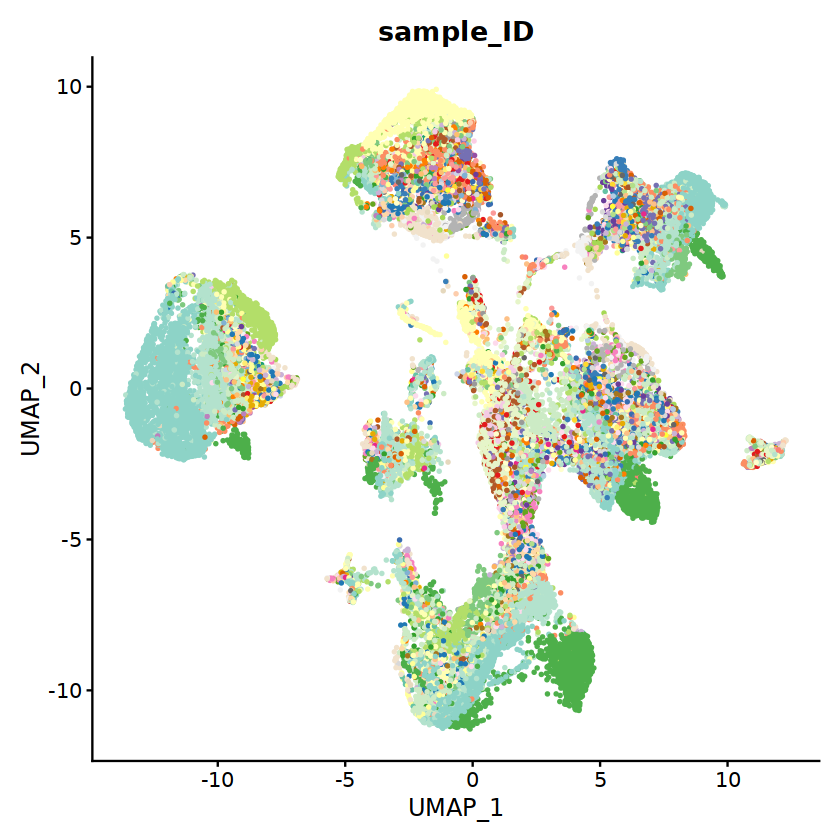

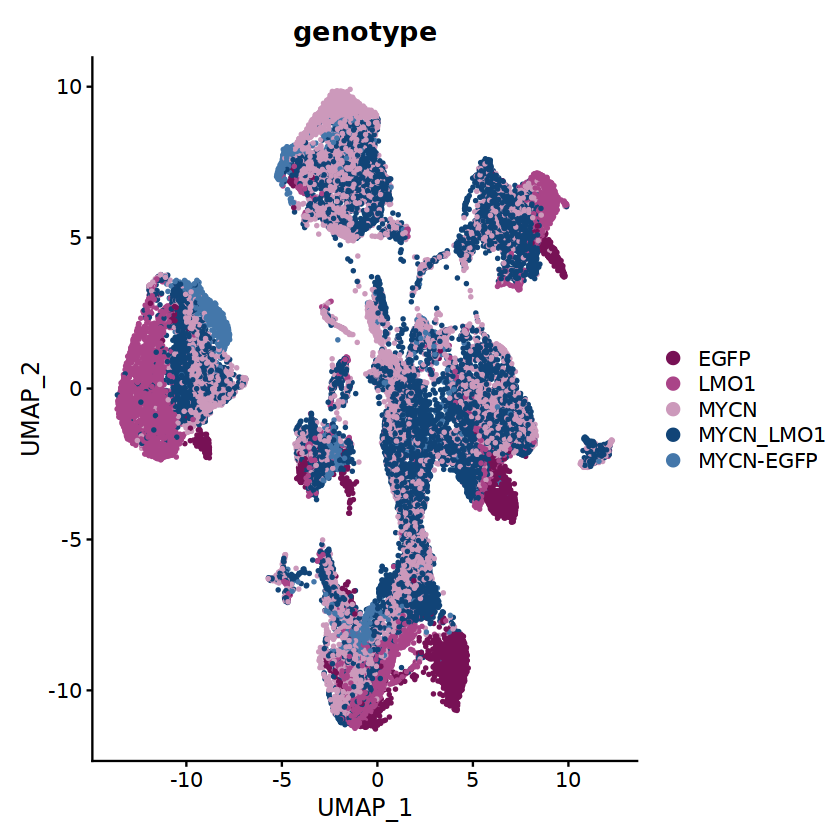

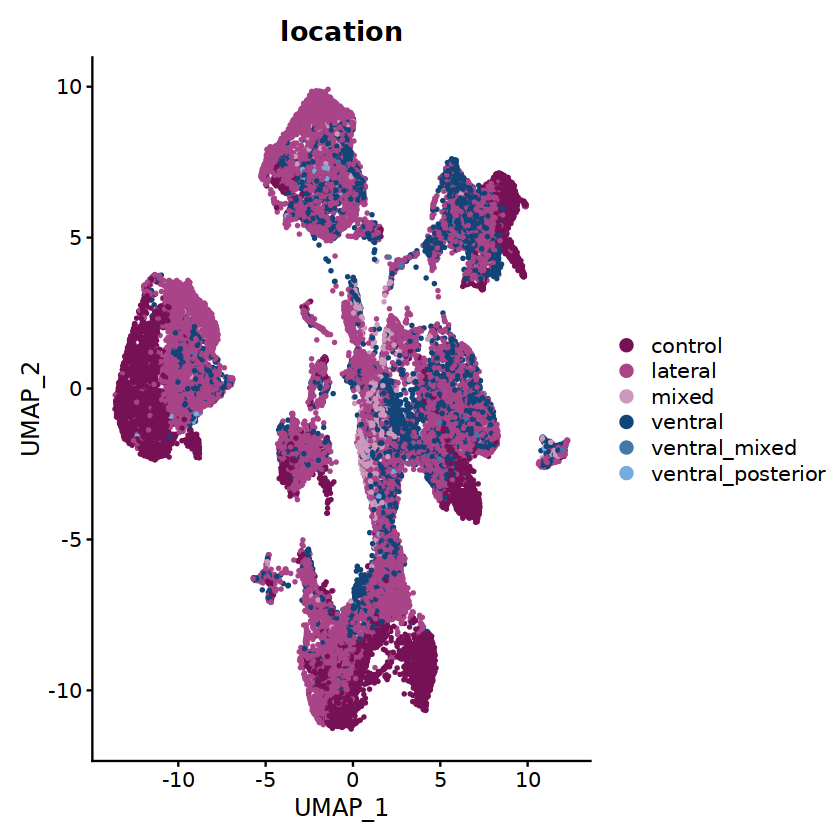

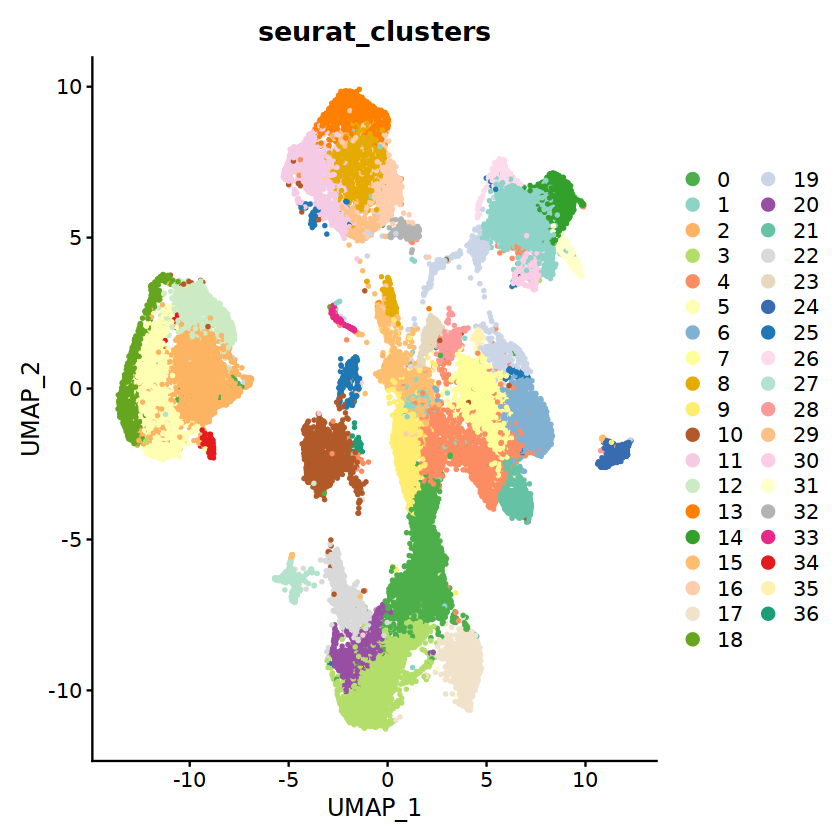

In [227]:
# Plot

set.seed(156)
n <- length(unique(dat_sub@meta.data$sample_ID))
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector_det = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))
col_vector_det=sample(col_vector_det, n)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "sample_ID", cols = col_vector_det, shuffle = T) + NoLegend()

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "genotype", cols = tol21rainbow, shuffle = T)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "location", cols = tol21rainbow, shuffle = T)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "seurat_clusters", cols = col_vector_det, shuffle = T)


#### Find cluster markers

In [ ]:

Idents(dat_sub)<- "seurat_clusters"

immune_markers <- FindAllMarkers(object = dat_sub, only.pos = TRUE, min.pct = 0.4, logfc.threshold = 0.7)

# Then print
write.csv(immune_markers, file = paste0("./celltype_assign_files/clusterMarkersAll_",sub_dat_name,"_seurclusts_minpct40_logfct_70.csv"))


#### Annotate cell types

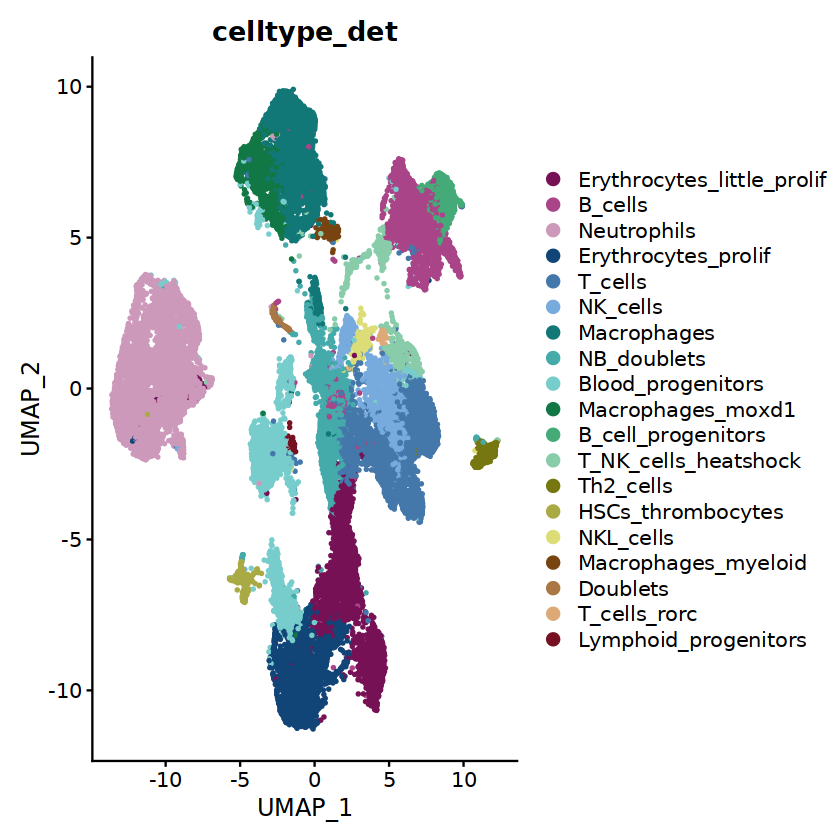

In [229]:
Idents(dat_sub) <- "seurat_clusters"

dat_sub <- RenameIdents(object = dat_sub,
                '0' = 'Erythrocytes_little_prolif',
                '1' = 'B_cells',
                '2' = 'Neutrophils',
                '3' = 'Erythrocytes_prolif',
                '4' = 'T_cells',
                '5' = 'Neutrophils',
                '6' = 'T_cells',
                '7' = 'NK_cells',
                '8' = 'Macrophages',
                '9' = 'NB_doublets',
                '10' = 'Blood_progenitors',
                '11' = 'Macrophages_moxd1',
                '12' = 'Neutrophils',
                '13' = 'Macrophages',
                '14' = 'B_cell_progenitors',
                '15' = 'NB_doublets',
                '16' = 'Macrophages',
                '17' = 'Erythrocytes_little_prolif',
                '18' = 'Neutrophils',
                '19' = 'T_NK_cells_heatshock',
                '20' = 'Erythrocytes_prolif',
                '21' = 'T_cells',
                '22' = 'Blood_progenitors',
                '23' = 'NK_cells',
                '24' = 'Th2_cells',
                '25' = 'Blood_progenitors',
                '26' = 'B_cells',
                '27' = 'HSCs_thrombocytes',
                '28' = 'NKL_cells',
                '29' = 'Macrophages',
                '30' = 'B_cells',
                '31' = 'B_cells',
                '32' = 'Macrophages_myeloid',
                '33' = 'Doublets',
                '34' = 'Neutrophils',
                '35' = 'T_cells_rorc',
                '36' = 'Lymphoid_progenitors'
    )

# write updated celltype annotation to metadata
dat_sub$celltype_det <- Idents(dat_sub)

DimPlot(object = dat_sub, reduction = 'umap', pt.size = 0.5, group.by = "celltype_det", cols = tol21rainbow, shuffle = T)


In [231]:
# save
save(dat_sub, file = paste0(outwd, sub_dat_name,"_clustered.Robj"))

## Transfer detailed cell types back to full dataset

In [233]:
dat_name <- 'allmerged_final'

load('./data/allmerged_final_nrblstm_clustered.Robj')
nb_dat <- dat_sub
rm(dat_sub)

load("./data/allmerged_final_stromal_clustered.Robj")
strom_dat <- dat_sub
rm(dat_sub)

load("./data/allmerged_final_immune_clustered.Robj")
imm_dat <- dat_sub
rm(dat_sub)

In [234]:
# generate a joint dataframe with detailed celltype annotations from all data subsets

meta_dat_celltype_det <- rbind(nb_dat@meta.data[,c('celltype','celltype_det')],
                               imm_dat@meta.data[,c('celltype','celltype_det')],
                               strom_dat@meta.data[,c('celltype','celltype_det')])

colnames(meta_dat_celltype_det) <- c('celltype_remove','celltype_det')

In [235]:
# Reload full, clustered dataset
dat_name <- "allmerged_final"

load(paste0(outwd, dat_name,"_clustered.Robj"))

ndims = 60

In [236]:
# Write out full metadata and add new, detailed cell type infos
metadat <- all.comb@meta.data
metadat$celltype_det <- NULL
metadat$celltype_remove <- NULL

meta_dat_celltype_det$barcode <- rownames(meta_dat_celltype_det)
metadat$barcode <- rownames(metadat)

metadat_ext <- left_join(metadat, meta_dat_celltype_det, by = 'barcode')
rownames(metadat_ext) <- metadat_ext$barcode

# check whether cell names on new metadata match those in the old metadata
table(rownames(metadat_ext) == rownames(metadat))

metadat_ext$celltype_remove <- NULL


  TRUE 
151217 

In [237]:
# If the above statement yielded 100 % TRUE, add metadata back to Seurat object
all.comb@meta.data <- metadat_ext


### Summarize cell type annotations and make final plots

In [243]:
# Add different resolution levels of cell type annotations
celltype_tab <- read.delim('./celltype_assign_files/CellType_levels_assignment_final.csv', stringsAsFactors = F, sep = ';')

# Make sure merging column with metadata is a character vector
all.comb@meta.data$celltype_det <- as.character(all.comb@meta.data$celltype_det)
celltype_tab$celltype_det <- as.character(celltype_tab$celltype_det)


In [252]:
metadat <- left_join(all.comb@meta.data, celltype_tab, by = 'celltype_det')
rownames(metadat) <- metadat$barcode

# check whether cell names on new metadata match those in the old metadata
table(rownames(metadat) == rownames(all.comb@meta.data))


  TRUE 
151217 

In [253]:
# If the above statement yielded 100 % TRUE, add metadata back to Seurat object
all.comb@meta.data <- metadat

In [254]:
# Create doublet column:

all.comb$celltype_doub <- all.comb$celltype_det
all.comb$celltype_doub <- as.character(all.comb$celltype_doub)
all.comb$celltype_det <- as.character(all.comb$celltype_det)

all.comb$celltype_doub[is.na(all.comb$celltype_det) == T] <- 'doublet'
all.comb$celltype_doub[all.comb$celltype_overall == 'doublet'] <- 'doublet'


In [267]:
# save object
dat_name <- "allmerged_final"

save(all.comb, file = paste0(outwd,dat_name,"_named_complete.Robj"))

#### UMAPS

In [257]:
# Sort cell type labels
all.comb$celltype_overall <- factor(all.comb$celltype_overall, levels = c('NB',
                                        'HSPCs',
                                        'Lymphoid_progenitors',
                                        'B_cells',
                                        'T_cells',
                                        'Th2_cells_ILC2s',
                                        'T_and_NK_cells',
                                        'NK_cells',
                                        'NKL_cells',
                                        'Macrophages_myeloid',
                                        'Macrophages',
                                        'Neutrophils',
                                        'Blood_progenitors',
                                        'Erythrocytes',
                                        'Fibroblasts',
                                        'Endothelial_cells',
                                        'Glial_sox10',
                                        'Keratinocytes',
                                        'Epithelial_cells',
                                        'Kidney_tubule',
                                        'Mucin_cells',
                                        'Multiciliated_cells',
                                        'Interrenal_cells',
                                        'Hepato_enterocytes',
                                        'Muscle_cells',
                                        'Smooth_muscle',
                                        'Doublets'
                                        )
                                    )


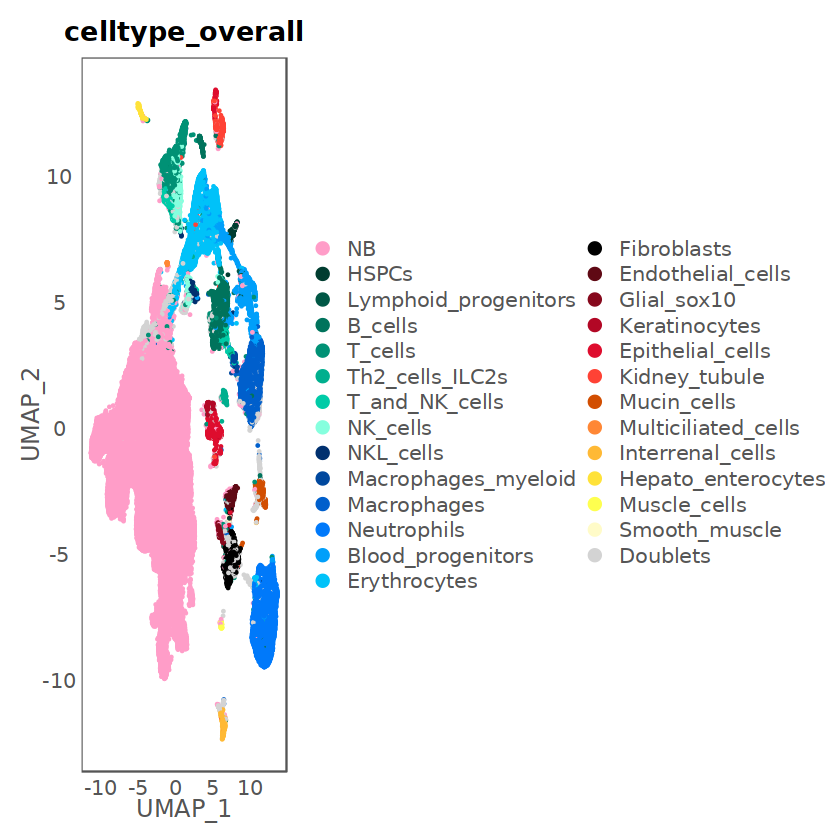

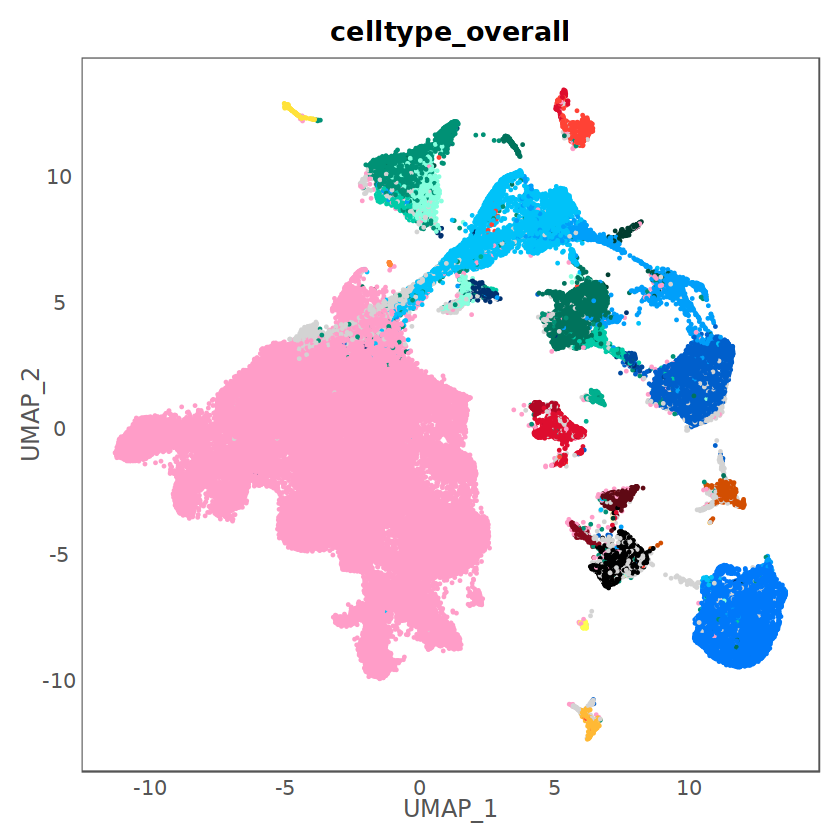

In [259]:
# Plot
DimPlot(object = all.comb, reduction = 'umap', pt.size = 0.3, group.by = "celltype_overall", repel = T, cols = c(colorblindfriend24_var[c(7,1:6,8:14)],colorblindfriend24_var[17:length(colorblindfriend24_var)],'light grey'), shuffle = T, raster=FALSE) +
            NoAxes() +
            mytheme_angledYtitle


DimPlot(object = all.comb, reduction = 'umap', pt.size = 0.3, group.by = "celltype_overall", repel = T, cols = c(colorblindfriend24_var[c(7,1:6,8:14)],colorblindfriend24_var[17:length(colorblindfriend24_var)],'light grey'), shuffle = T, raster=FALSE) +
            NoLegend() +
            NoAxes() +
            mytheme_angledYtitle

### Get marker genes for each celltype

In [ ]:

Idents(all.comb)<- "celltype_overall"

# get markers:
markers_cts <- FindAllMarkers(object = all.comb, only.pos = TRUE, min.pct = 0.4, logfc.threshold = 0.7)

# Then print
write.csv(markers_cts, file = paste0("./celltype_assign_files/clusterMarkersAll_",dat_name,"_CelltypeOverall_minpct40_logfct_70.csv"))


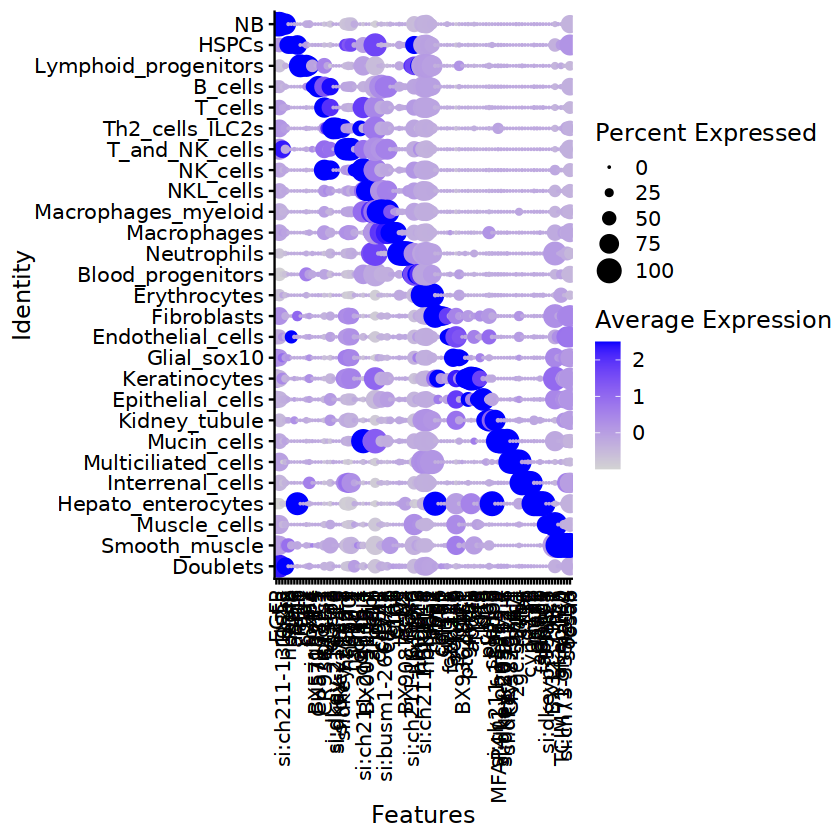

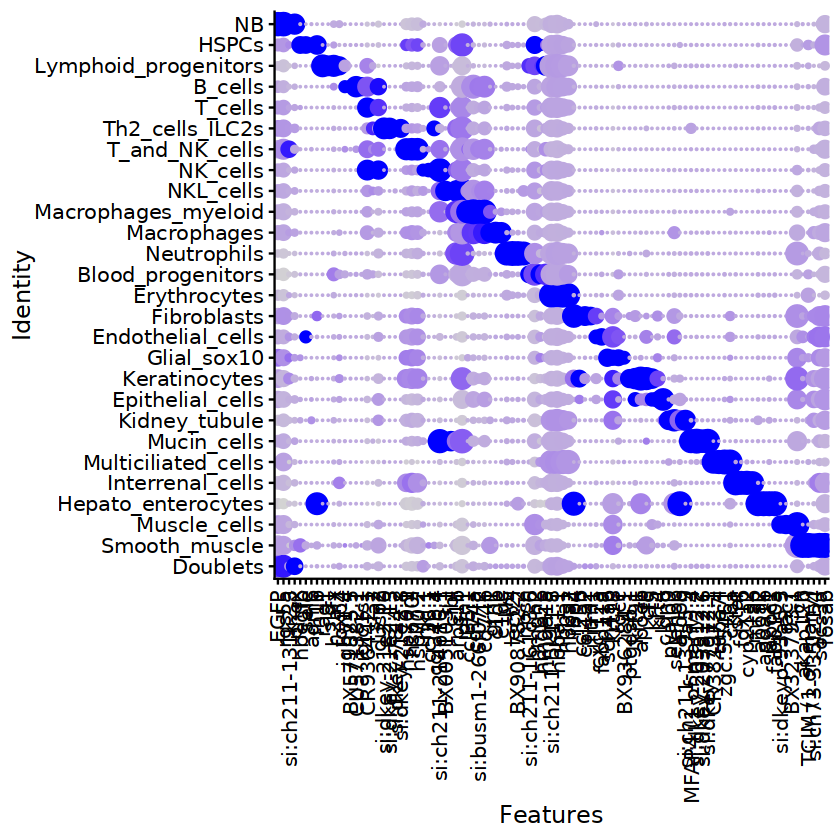

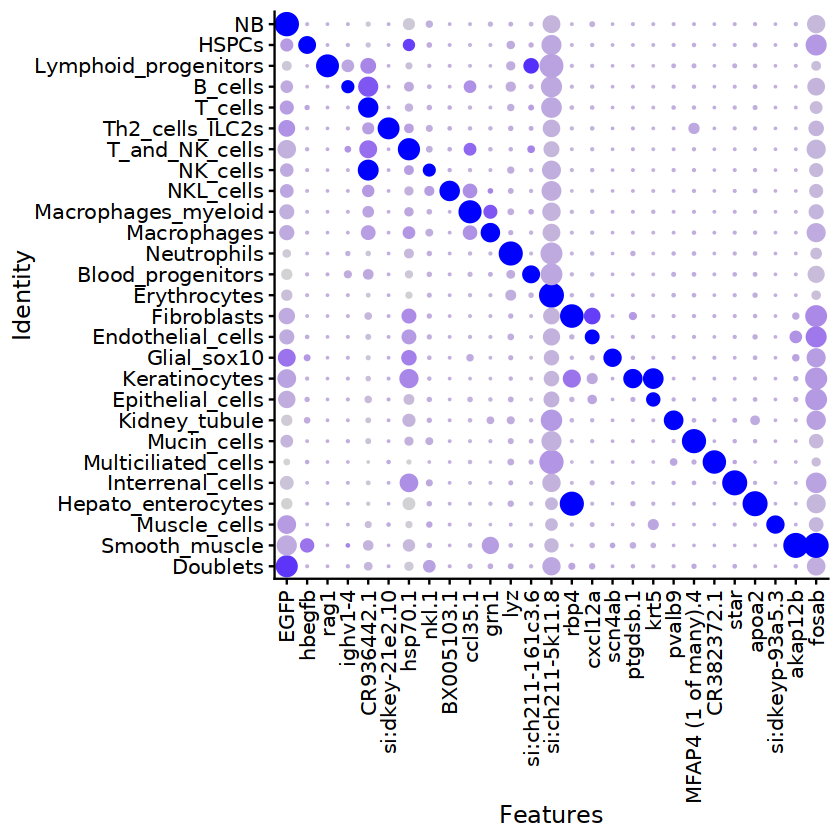

In [265]:
# Dotplot for top cell type marker genes

markers_cts <- read.delim(paste0("./celltype_assign_files/clusterMarkersAll_",dat_name,"_CelltypeOverall_minpct40_logfct_70.csv"), stringsAsFactors = F, sep = ',', row.names = 1)
markers_cts %>% group_by(cluster) %>% top_n(n = 4, wt = avg_log2FC) -> top6
top6 <- as.data.frame(top6)
rownames(top6) <- paste0('gene_',c(1:nrow(top6)))
top6ord <- top6[order(top6$avg_log2FC, decreasing = T),]
top6ord <- top6ord[duplicated(top6ord$gene) == F,]

top6 <- top6[rownames(top6) %in% rownames(top6ord),]
top6 %>% group_by(cluster) %>% top_n(n = 4, wt = avg_log2FC) -> top4

all.comb$celltype_overall <- factor(all.comb$celltype_overall, levels = rev(c('NB',
                                        'HSPCs',
                                        'Lymphoid_progenitors',
                                        'B_cells',
                                        'T_cells',
                                        'Th2_cells_ILC2s',
                                        'T_and_NK_cells',
                                        'NK_cells',
                                        'NKL_cells',
                                        'Macrophages_myeloid',
                                        'Macrophages',
                                        'Neutrophils',
                                        'Blood_progenitors',
                                        'Erythrocytes',
                                        'Fibroblasts',
                                        'Endothelial_cells',
                                        'Glial_sox10',
                                        'Keratinocytes',
                                        'Epithelial_cells',
                                        'Kidney_tubule',
                                        'Mucin_cells',
                                        'Multiciliated_cells',
                                        'Interrenal_cells',
                                        'Hepato_enterocytes',
                                        'Muscle_cells',
                                        'Smooth_muscle',
                                        'Doublets'
                                        ))
                                    )


DotPlot(all.comb, features = top4$gene, group.by = 'celltype_overall') +
        theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

DotPlot(all.comb, features = top4$gene, group.by = 'celltype_overall') +
        theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
        NoLegend()


# Only top marker gene per celltype
top6 %>% group_by(cluster) %>% top_n(n = 1, wt = avg_log2FC) -> top1

DotPlot(all.comb, features = top1$gene, group.by = 'celltype_overall') +
        theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
        NoLegend()

## Create a SingleR reference of the cell types
Remove doublets from the Seurat object, as they are not a proper cell type.

In [ ]:
dat_name <- "allmerged_final"
Idents(all.comb) <- 'celltype_overall'

In [ ]:
# remove doublets
all.comb <- subset(all.comb, idents = c('Doublets'), invert = T)

In [ ]:
# Create reference based on the doublet-free data
# ref: A numeric matrix of reference expression values, usually containing log-expression values. Here, we use the 'data' slot of the Seurat object, which contains log-normalized expression values.
# labels: A character vector or factor of known labels for all cells in ref. Here, we use the annotated cell types

ref <- as.matrix(GetAssayData(all.comb, slot = 'data'))
labels <- all.comb@meta.data$celltype_overall
names(labels) <- rownames(all.comb@meta.data)

singlR_ref_data <- aggregateReference(
                                    ref,
                                    labels,
                                    power = 0
                                    )

save(singlR_ref_data, file = paste0(dat_name, "_celltypeOverall_withoutDoublets_singlR_ref.Robj"))
